In [1]:
import sys
import seaborn as sns
import os
import glob
from matplotlib import pyplot as plt
import numpy as np
import plot as pltfn
from sklearn.cluster import KMeans
import admin_functions as adfn
#plt.style.use('dark_background')
sns.reset_orig()
%load_ext autoreload
%autoreload

# Define paths
#------------------------------------------------------------------
Fdrop = '/Users/dominicburrows/Dropbox/PhD/analysis/'
Fmac = '/Users/dominicburrows/Documents/'
F10t = '/Volumes/Dominic 10tb/'
Ffig = '/Users/dominicburrows/Dropbox/PhD/figures/'
Ftm = '/Volumes/Dominic Time Machine/'

## Generalised seizures

Find start and end of all generalised events
* Fit a smooth baseline - create standard deviation 
* Find all timeframes where amplitude is above baseline*scalar
* Find all timeframes that are continuously above >10 frames

In [2]:
# Create lists of trace data
#---------------------------------------------------------------------------
experiment = 'PTZ-WILDTYPE'
os.chdir(Fdrop + 'Project/' + experiment)
trace_list = sorted(glob.glob('*BLN-*_realtrace.npy'))
dff_list = sorted(glob.glob('*BLN-*_deltaff.npy'))
trace_list, dff_list

(['PTZ-WILDTYPE-03_2photon_sess-01-BLN-PTZ05-PTZ20_run-01_realtrace.npy'],
 ['PTZ-WILDTYPE-03_2photon_sess-01-BLN-PTZ05-PTZ20_run-01_deltaff.npy'])

In [14]:
traces = np.load(trace_list[0])
dffs = np.load(dff_list[0])

In [48]:
sz_trace = traces[:,2*int(traces.shape[1]/3):]
sz_dff = dffs[:,2*int(dffs.shape[1]/3):]
sz_mean = np.apply_along_axis(np.mean, 0, sz_trace)

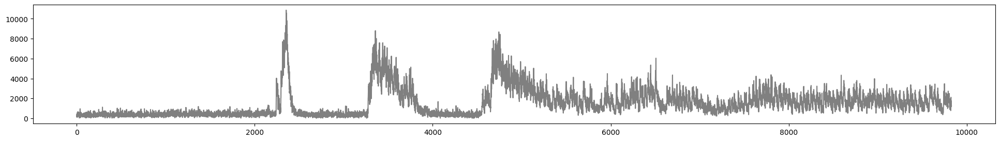

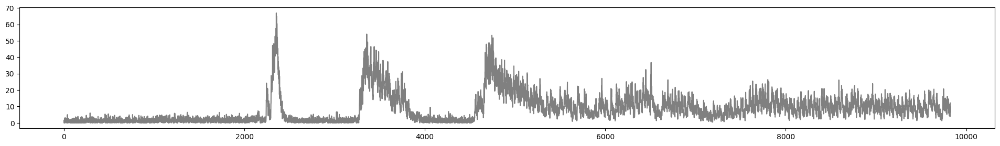

In [50]:
fig, ax = plt.subplots(figsize= (24,3))  
plt.plot(sz_trace[6], c='grey')
fig, ax = plt.subplots(figsize= (24,3))  
plt.plot(sz_dff[6], c='grey')
plt.show()

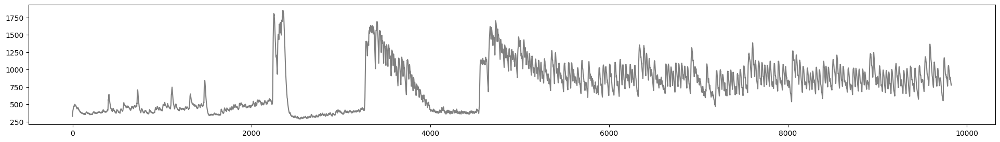

In [51]:
fig, ax = plt.subplots(figsize= (24,3))  
plt.plot(sz_mean, c='grey')
plt.show()

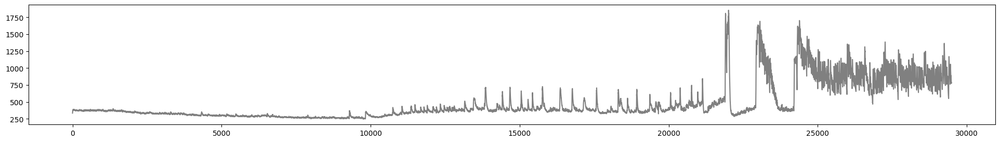

In [34]:

fig, ax = plt.subplots(figsize= (24,3))  
plt.plot(mean, c='grey')
plt.show()

In [57]:
#np.save("sz_trace.npy", sz_trace)
#np.save("sz_deltaff.npy", sz_dff)
#np.save("sz_brainsum.npy", sz_mean)
np.save("sz_seizure_index.npy", sz_gen_index)

In [56]:
sz_gen_index = gen_index
sz_gen_index

array([2212., 2213., 2214., ..., 9587., 9588., 9589.])

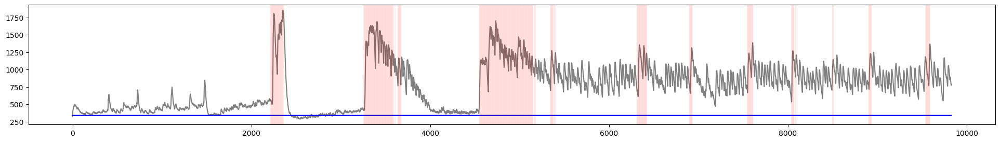

In [54]:
mean = sz_mean
window = adfn.window(50, mean.shape[0])[0]
scalar = 3
percentile = 0.08

#trace = np.load(trace_list[0])
#mean = np.apply_along_axis(np.mean, 0, trace)
baseline = np.zeros(mean.shape[0])
for i in range(mean.shape[0]):
    baseline[i] = (np.mean(mean[np.where(mean < np.quantile(mean, percentile, axis=0))]))

meanbase = np.mean(baseline)
gen_index = []
for e in range(mean.shape[0]):
    if np.mean(mean[e:e+window]) > scalar*meanbase:
        gen_index = np.append(gen_index, e)

fig, ax = plt.subplots(figsize= (24,3))  
plt.plot(mean, c='grey')
plt.plot(baseline, c = 'blue')
for x in gen_index: plt.axvline(x=x, c='red', alpha = 0.01)
plt.show()

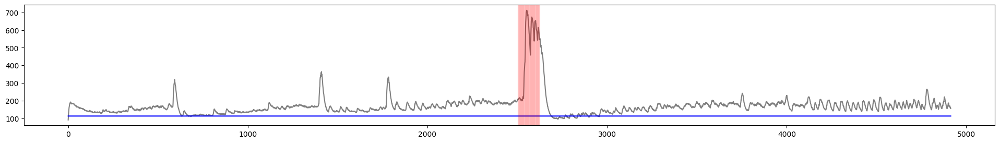

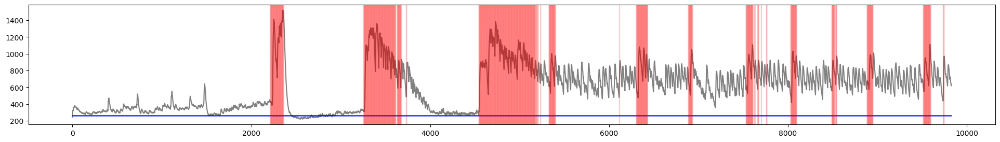

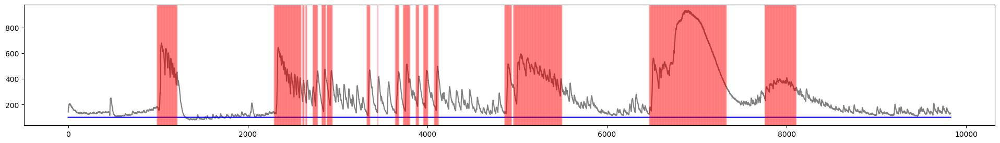

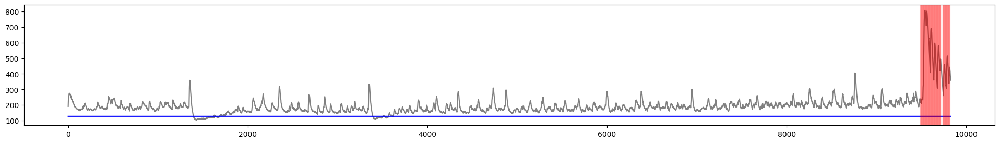

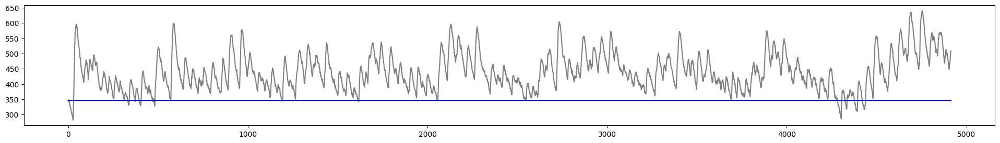

...

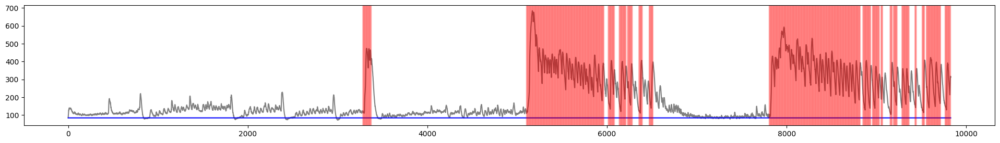

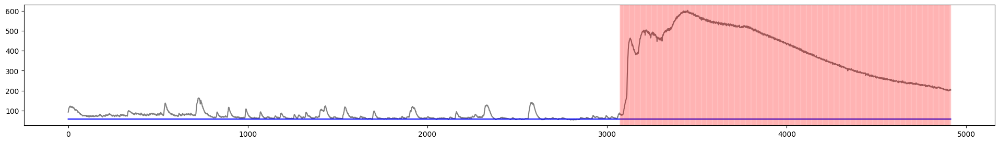

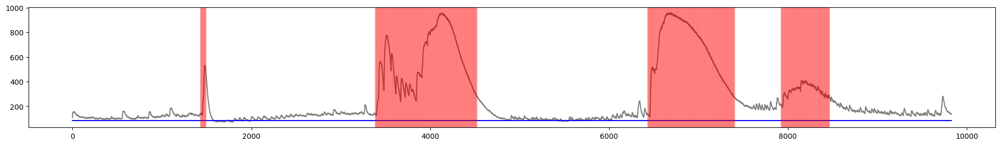

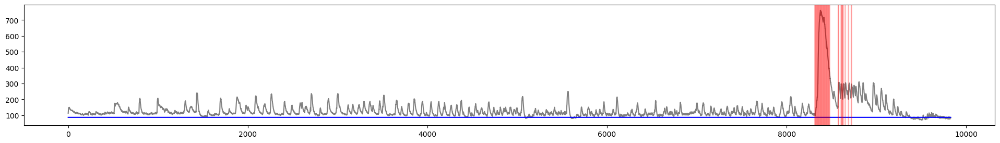

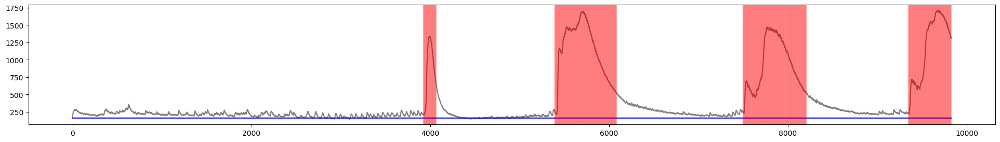

In [105]:
window = adfn.window(50, mean.shape[0])[0]
scalar = 3
percentile = 0.08
for o in range(len(p20raw)):
    p20 = np.load(p20raw[o])
    mean = np.apply_along_axis(np.mean, 0, p20)
    baseline = np.zeros(mean.shape[0])
    for i in range(mean.shape[0]):
        baseline[i] = (np.mean(mean[np.where(mean < np.quantile(mean, percentile, axis=0))]))
        
    meanbase = np.mean(baseline)
    gen_index = []
    for e in range(mean.shape[0]):
        if np.mean(mean[e:e+window]) > scalar*meanbase:
            gen_index = np.append(gen_index, e)

    fig, ax = plt.subplots(figsize= (24,3))  
    plt.plot(mean, c='grey')
    plt.plot(baseline, c = 'blue')
    for x in gen_index: plt.axvline(x=x, c='red', alpha = 0.05)
    plt.show()

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


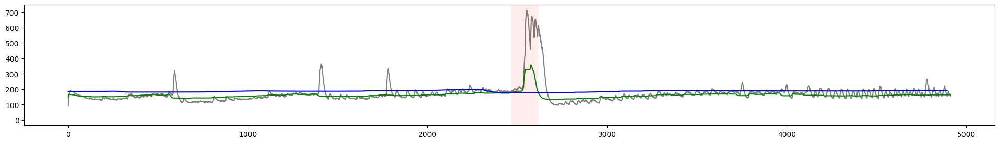

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


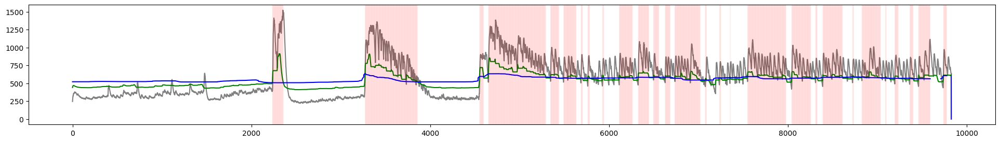

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


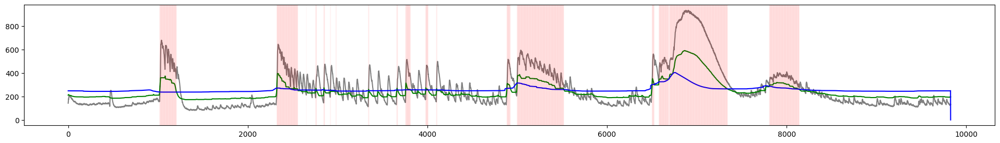

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


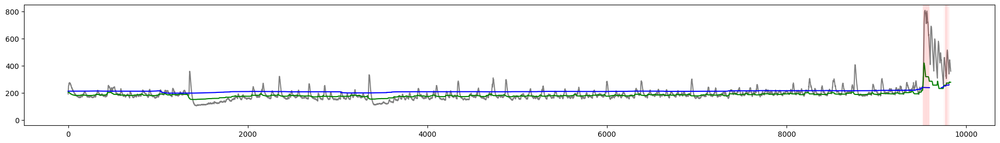

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


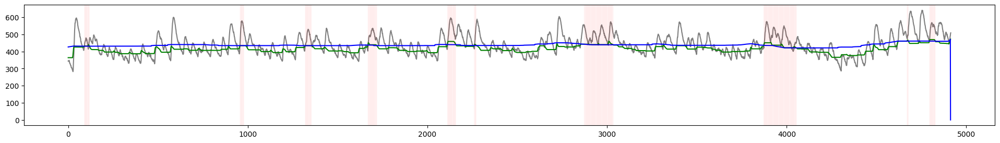

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


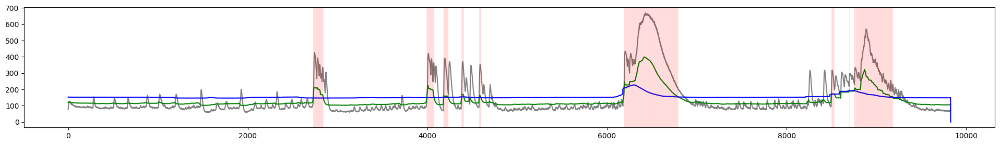

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


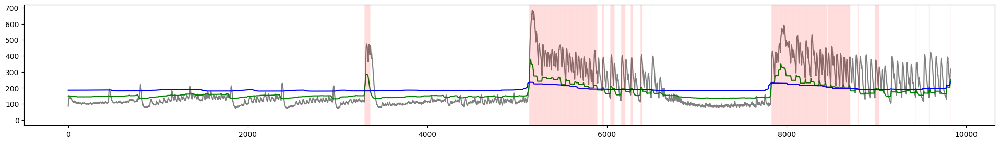

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


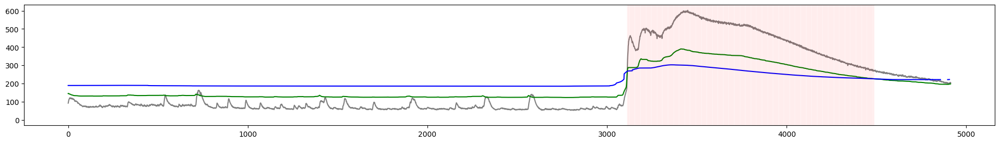

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


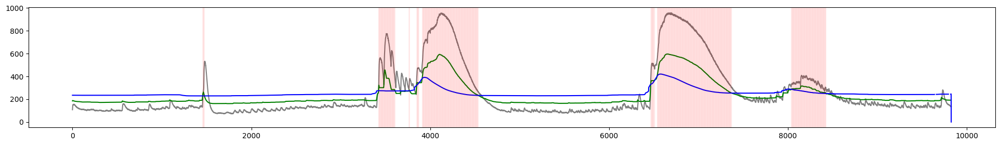

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


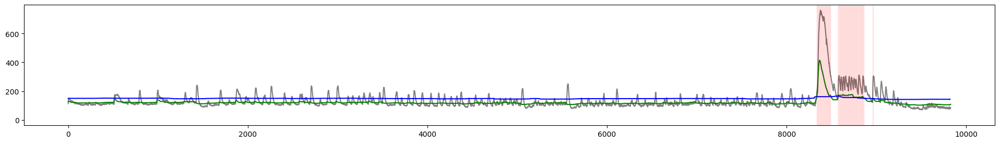

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


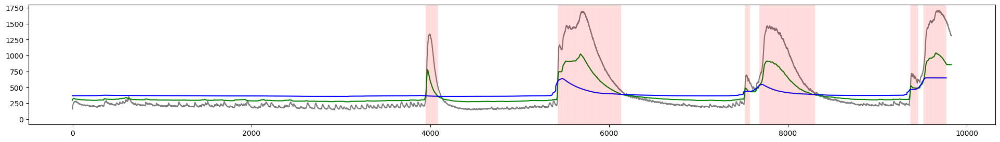

In [186]:
smooth_window = adfn.window(50, mean.shape[0])[0]
base_window = adfn.window(50, mean.shape[0]-1)[0]
smooth_percentile = 0.08
base_percentile = 0.2
for o in range(len(p20raw)):
    p20 = np.load(p20raw[o])
    mean = np.apply_along_axis(np.mean, 0, p20)
    smooth = np.zeros(mean.shape[0]-1)
    baseline = np.zeros(mean.shape[0]-1)
    gen_index = []
    for i in range(mean.shape[0]-1):
        smooth[i] = (np.mean(mean) + np.mean(mean[i:i+smooth_window][np.where(mean[i:i+smooth_window] < np.quantile(mean[i:i+smooth_window], smooth_percentile, axis=0))]))/2
    for e in range(smooth.shape[0]-1): 
        baseline[e] = 30 + (np.mean(smooth) + np.mean(smooth[e:e+base_window][np.where(smooth[e:e+base_window] < np.quantile(smooth[e:e+base_window], base_percentile, axis=0))]))/2
        if smooth[e] > baseline[e]:
            gen_index = np.append(gen_index, e)
    fig, ax = plt.subplots(figsize= (24,3))  
    plt.plot(mean, c='grey')
    plt.plot(smooth, c = 'green')
    plt.plot(baseline, c='blue')
    for x in gen_index: plt.axvline(x=x, c='red', alpha = 0.01)
    plt.show()

## Localised seizures

In [430]:
# Create lists of trace data
#---------------------------------------------------------------------------
experiment = 'PTZ-WILDTYPE'
os.chdir(Fdrop + 'Project/' + experiment)
blnraw = sorted(glob.glob('*BLN*_realtrace.npy'))
p5raw = sorted(glob.glob('*PTZ05*_realtrace.npy'))
p20raw = sorted(glob.glob('*PTZ20*_realtrace.npy'))
blncoord = sorted(glob.glob('*BLN*_realcoord.npy'))
p5coord = sorted(glob.glob('*PTZ05*_realcoord.npy'))
p20coord = sorted(glob.glob('*PTZ20*_realcoord.npy'))
blncoord

['PTZ-WILDTYPE-02_2photon_sess-01-6dpf_BLN_run-01_realcoord.npy',
 'PTZ-WILDTYPE-03_2photon_sess-01-6dpf_BLN_run-01_realcoord.npy',
 'PTZ-WILDTYPE-04_2photon_sess-01-6dpf_BLN_run-01_realcoord.npy',
 'PTZ-WILDTYPE-05_2photon_sess-01-6dpf_BLN_run-01_realcoord.npy',
 'PTZ-WILDTYPE-06_2photon_sess-01-6dpf_BLN_run-01_realcoord.npy',
 'PTZ-WILDTYPE-07_2photon_sess-01-6dpf_BLN_run-01_realcoord.npy',
 'PTZ-WILDTYPE-08_2photon_sess-01-6dpf_BLN_run-01_realcoord.npy',
 'PTZ-WILDTYPE-09_2photon_sess-01-6dpf_BLN_run-01_realcoord.npy',
 'PTZ-WILDTYPE-10_2photon_sess-01-6dpf_BLN_run-01_realcoord.npy',
 'PTZ-WILDTYPE-11_2photon_sess-01-6dpf_BLN_run-01_realcoord.npy',
 'PTZ-WILDTYPE-12_2photon_sess-01-6dpf_BLN_run-09_realcoord.npy']

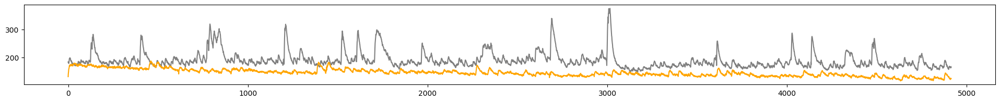

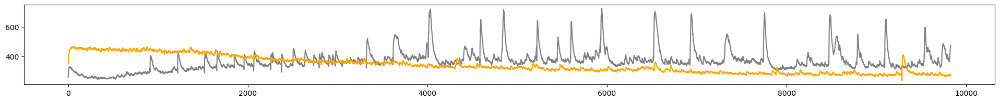

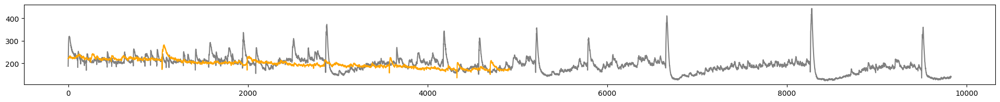

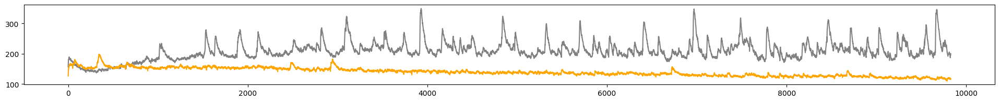

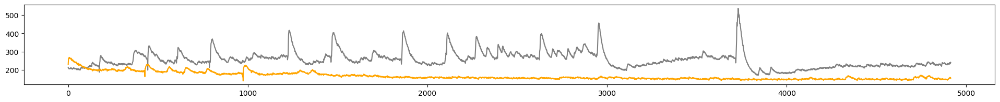

...

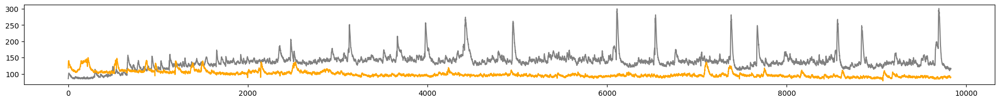

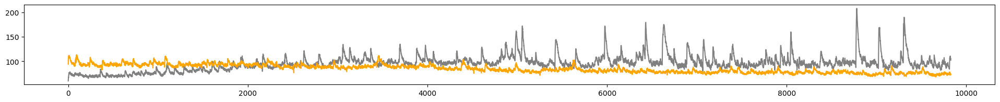

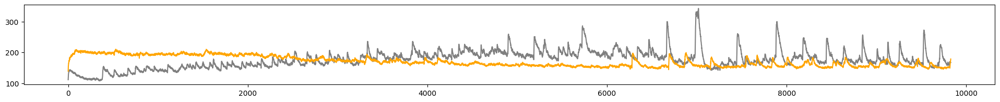

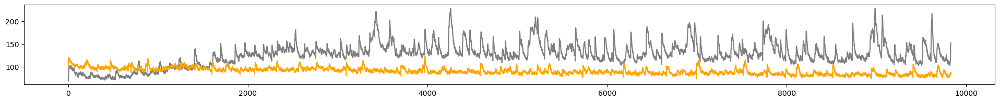

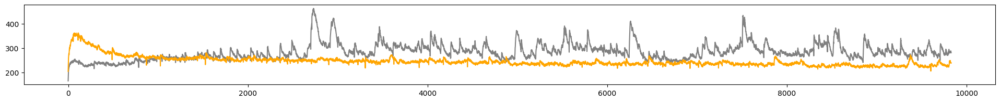

In [4]:
#PLOT PREICTAL EVENTS OVER BASELINE
for o in range(len(p5raw)):
    p5 = np.load(p5raw[o])
    fig, ax = plt.subplots(figsize= (24,2))  
    mean = np.apply_along_axis(np.mean, 0, p5)
    plt.plot(mean, c = 'grey')
    bln = np.load(blnraw[o])
    mean = np.apply_along_axis(np.mean, 0, bln)
    plt.plot(mean, c = 'orange')
    plt.show()

### Identify local events

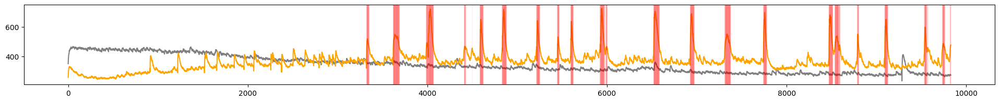

In [461]:
#PLOT PREICTAL EVENTS OVER BASELINE
scalar = 2
fish = 1
fig, ax = plt.subplots(figsize= (24,2))  
bln = np.load(blnraw[fish])
bln_mean = np.apply_along_axis(np.mean, 0, bln)
plt.plot(bln_mean, c = 'grey')
p5 = np.load(p5raw[fish])
p5_mean = np.apply_along_axis(np.mean, 0, p5)
plt.plot(p5_mean, c = 'orange')
where = np.where((np.mean(bln_mean) + np.std(bln_mean)*scalar) < p5_mean)[0]
for x in where: plt.axvline(x=x, c='red', alpha = 0.05)
plt.show()

### Find cells driving local events

In [462]:
import more_itertools as mit
from operator import itemgetter 
time_list = [list(group) for group in mit.consecutive_groups(where)]
novlist = [len(time_list[x]) for x in range(len(time_list))]
time_list = itemgetter(*np.where(np.asarray(novlist) > 2)[0])(time_list)

In [490]:
time_list[5]

[4586,
 4587,
 4588,
 4589,
 4590,
 4591,
 4592,
 4593,
 4594,
 4595,
 4596,
 4597,
 4598,
 4599,
 4600,
 4601,
 4602,
 4603,
 4604,
 4605,
 4606,
 4607,
 4608,
 4609,
 4610,
 4611,
 4612,
 4613,
 4614,
 4615,
 4616,
 4617,
 4618,
 4619,
 4620,
 4621]

In [436]:
# Find for given window size - find maximum amplitude segment - then calculate correlation
def max_correlation(window, tracematrix, meantrace):
    sum_list=[]
    for t in range(len(meantrace)-window+1):
        current = meantrace[t:t+window]
        sum_list = np.append(sum_list, np.sum(current))

    start = np.where(sum_list == np.max(sum_list))[0][0]
    block = np.linspace(start, start+window-1, window)
    block_corr_mat = np.corrcoef(tracematrix[:,int(block[0]):int(block[len(block)-1]+1)])#Correlation matrix of block
    np.fill_diagonal(block_corr_mat,0) #Remove self-correlation
    return(block_corr_mat,block)

In [491]:
choose = 5
period = max_correlation(len(time_list[choose]), bln, bln_mean)
period

(array([[ 0.        ,  0.16914225, -0.05419831, ..., -0.10043926,
          0.21866614,  0.24999305],
        [ 0.16914225,  0.        , -0.28009348, ..., -0.28711719,
          0.38098588,  0.13079285],
        [-0.05419831, -0.28009348,  0.        , ...,  0.16316183,
          0.03000922,  0.05289175],
        ...,
        [-0.10043926, -0.28711719,  0.16316183, ...,  0.        ,
         -0.19347015, -0.1841959 ],
        [ 0.21866614,  0.38098588,  0.03000922, ..., -0.19347015,
          0.        ,  0.23389988],
        [ 0.24999305,  0.13079285,  0.05289175, ..., -0.1841959 ,
          0.23389988,  0.        ]]),
 array([46., 47., 48., 49., 50., 51., 52., 53., 54., 55., 56., 57., 58.,
        59., 60., 61., 62., 63., 64., 65., 66., 67., 68., 69., 70., 71.,
        72., 73., 74., 75., 76., 77., 78., 79., 80., 81.]))

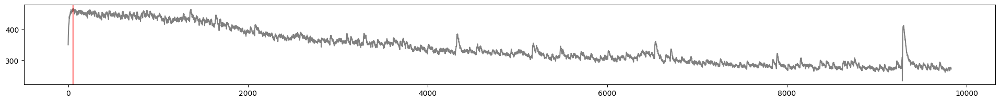

In [466]:
#PLOT PREICTAL EVENTS OVER BASELINE
fig, ax = plt.subplots(figsize= (24,2))  
plt.plot(bln_mean, c = 'grey')
for x in period[1]: plt.axvline(x=x, c='red', alpha = 0.05)
plt.show()

In [498]:
thresh = 0.9#np.mean(period[0]) + 3*np.std(period[0])
thresh

0.9

In [319]:
np.std(period[0])

0.1789176014567623

In [301]:
#Loop through each event
for i in range(len(time_list)):
    segment = p5[:,time_list[i][0]:time_list[i][len(time_list[i])-1]]

In [499]:
#Correlation

segment = p5[:,time_list[choose][0]:time_list[choose][len(time_list[choose])-1]]
corr_mat = np.triu(np.corrcoef(segment)) #Take upper triangular of matrix 
np.fill_diagonal(corr_mat,0) #Remove self-correlation
vector = np.ravel(corr_mat)

#Find correlated cells above threshold
corr_cells = []
corr_vals = np.where(vector > thresh)[0] #values above threshold
for e in range(len(corr_vals)):
    val = corr_vals[e]
    row = int(val/corr_mat.shape[0]) 
    column = val - (row*corr_mat.shape[0])
    corr_cells = np.append(corr_cells, np.append(row, column))
corr_cells = corr_cells.astype(int)

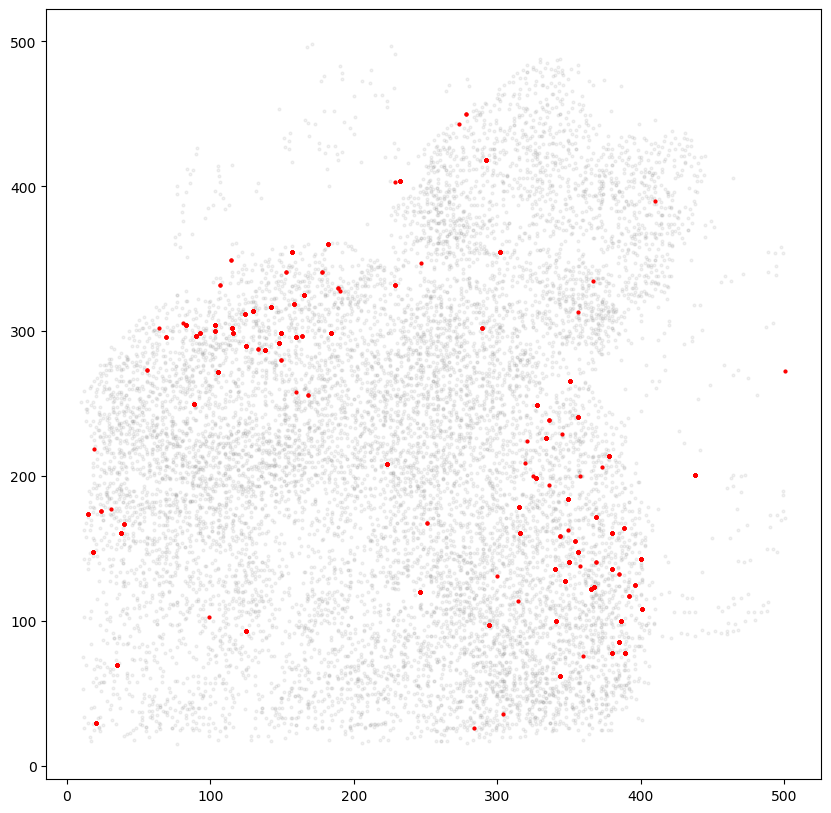

In [500]:
fig,axarr = plt.subplots(figsize = (10,10))
coord = np.load(p5coord[fish])
axarr.scatter(coord[:,0], coord[:,1], s = 4, color = 'grey' , alpha = 0.1)
axarr.scatter(coord[:,0][corr_cells], coord[:,1][corr_cells], s = 4, color = 'red' , alpha = 1)
plt.show()

In [496]:
#Amplitude
segment = p5[:,time_list[choose][0]:time_list[choose][len(time_list[choose])-1]]
amp_p5 = np.apply_along_axis(sum, 1, p5[:,time_list[choose][0]:time_list[choose][len(time_list[choose])-1]])

corr_cells =  np.where(amp_p5 > np.percentile(amp_p5, 95))[0]

In [450]:
#Amplitude
segment = p5[:,time_list[choose][0]:time_list[choose][len(time_list[choose])-1]]
amp_p5 = np.apply_along_axis(sum, 1, p5[:,time_list[choose][0]:time_list[choose][len(time_list[choose])-1]])
amp_b = np.apply_along_axis(sum, 1, bln[:,time_list[choose][0]:time_list[choose][len(time_list[choose])-1]])

corr_cells = np.where(amp_p5 > np.max(amp_b))[0]

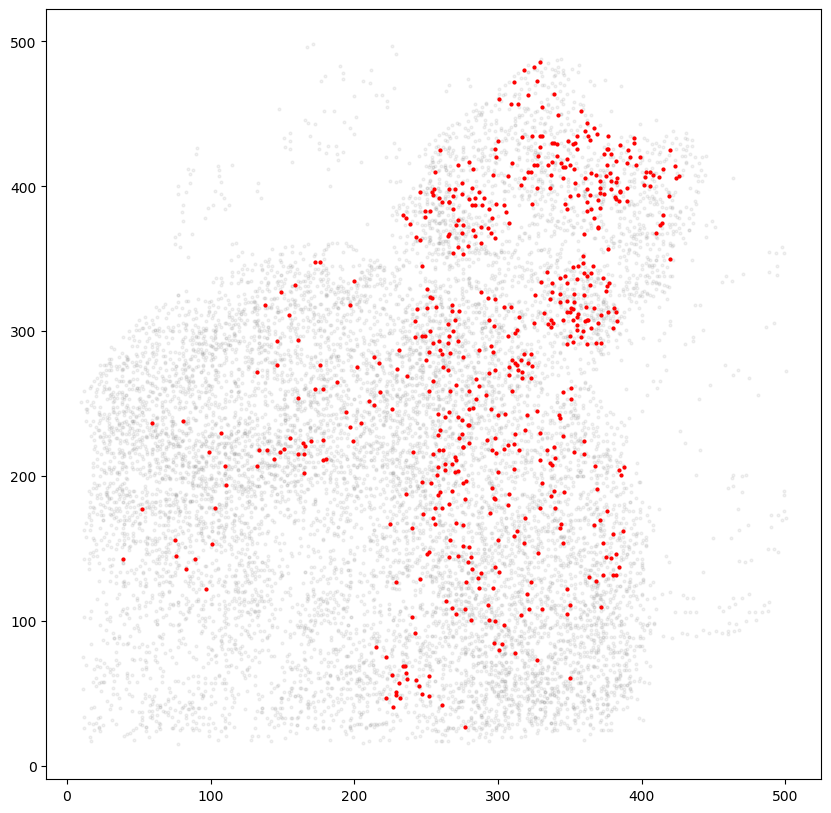

In [497]:
fig,axarr = plt.subplots(figsize = (10,10))
coord = np.load(p5coord[fish])
axarr.scatter(coord[:,0], coord[:,1], s = 4, color = 'grey' , alpha = 0.1)
axarr.scatter(coord[:,0][corr_cells], coord[:,1][corr_cells], s = 4, color = 'red' , alpha = 1)
plt.show()

In [ ]:
#Spatial bins - kmeans cluster - increase cluster size - must include given cells? 



# Inputs

## Cell correlation
* periods of high correlation - define threshold
* local correlation - sliding spatial window

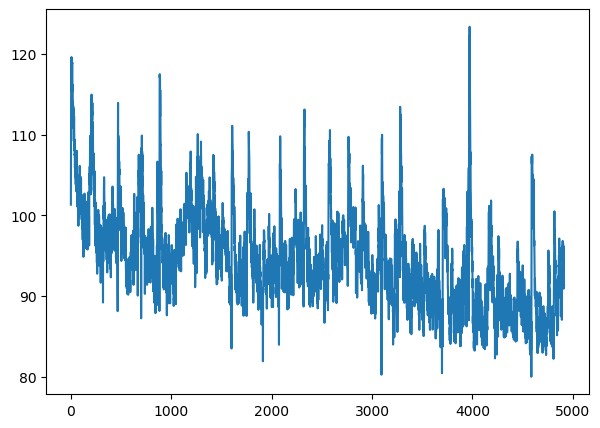

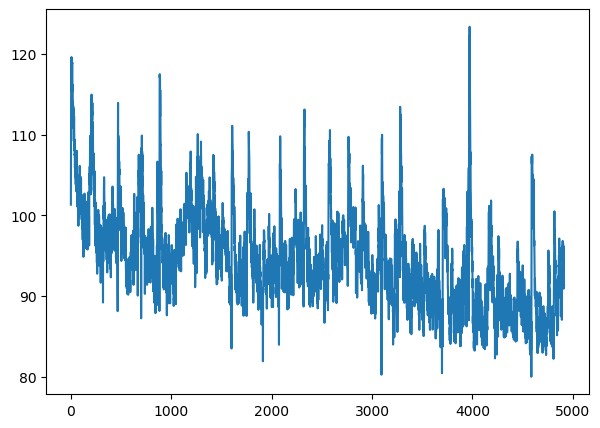

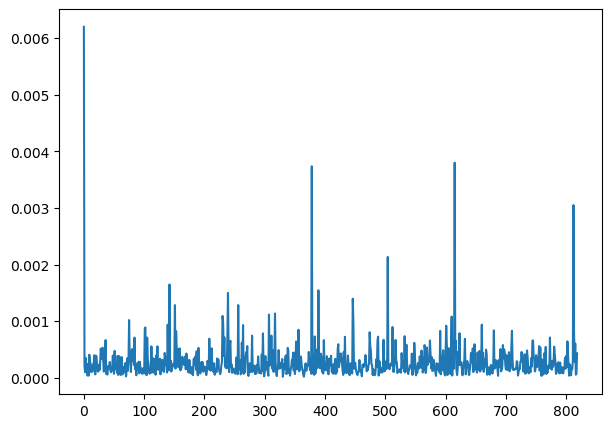

KeyboardInterrupt: 

In [36]:
#Mean correlation all cells
for i in range(len(blnraw)):
    data = np.load(blnraw[i])
    fig, axarr = plt.subplots(figsize = (7,5))
    mean = np.apply_along_axis(np.mean, 0, bln)
    plt.plot(mean)
    count = 0
    window = adfn.window(5, data.shape[1])
    corr_vec = np.zeros(np.int(data.shape[1]/window))
    for e in range(np.int(data.shape[1]/window)):
        corr_vec[e] = np.mean(np.corrcoef(data[:,count:count+window]))
        count+=window
    fig, axarr = plt.subplots(figsize = (7,5))
    plt.plot(corr_vec)
    plt.show()

In [31]:
bln.shape

(7273, 4914)

In [29]:
adfn.window(5, bln.shape[0])

7

In [30]:
bln.shape[0]

7273

In [15]:
np.corrcoef(bln)

array([[ 1.00000000e+00, -4.67494860e-02, -2.48105947e-01, ...,
         3.32219032e-02, -8.85454880e-04,  8.03526843e-03],
       [-4.67494860e-02,  1.00000000e+00, -5.12285422e-02, ...,
        -1.10932341e-02, -1.24711858e-02, -4.80669375e-03],
       [-2.48105947e-01, -5.12285422e-02,  1.00000000e+00, ...,
        -3.74610623e-02,  1.49143304e-03, -4.32227426e-03],
       ...,
       [ 3.32219032e-02, -1.10932341e-02, -3.74610623e-02, ...,
         1.00000000e+00,  1.98214279e-02,  9.75915723e-03],
       [-8.85454880e-04, -1.24711858e-02,  1.49143304e-03, ...,
         1.98214279e-02,  1.00000000e+00,  2.53080382e-02],
       [ 8.03526843e-03, -4.80669375e-03, -4.32227426e-03, ...,
         9.75915723e-03,  2.53080382e-02,  1.00000000e+00]])

In [33]:
np.corrcoef(bln[:,:10])

0.0020458868507719267

In [ ]:
#Local cells correlation

#Define windows of different sizes


## State space trajectory
* PCA - register fish to same component space?
* Velocity - euclidean distance point to point 
* Component correlation

In [3]:
# Create lists of trace data
#---------------------------------------------------------------------------
experiment = 'PTZ-WILDTYPE'
os.chdir(Fdrop + 'Project/' + experiment)
blnraw = sorted(glob.glob('*_BLN*_cutrealtrace.npy'))
p5raw = sorted(glob.glob('*_PTZ05_*_cutrealtrace.npy'))
p20raw = sorted(glob.glob('*_PTZ20*_cutrealtrace.npy'))
blnraw,p5raw,p20raw

(['PTZ-WILDTYPE-02_2photon_sess-01-6dpf_BLN_run-01_cutrealtrace.npy',
  'PTZ-WILDTYPE-03_2photon_sess-01-6dpf_BLN_run-01_cutrealtrace.npy',
  'PTZ-WILDTYPE-04_2photon_sess-01-6dpf_BLN_run-01_cutrealtrace.npy',
  'PTZ-WILDTYPE-05_2photon_sess-01-6dpf_BLN_run-01_cutrealtrace.npy',
  'PTZ-WILDTYPE-06_2photon_sess-01-6dpf_BLN_run-01_cutrealtrace.npy',
  'PTZ-WILDTYPE-07_2photon_sess-01-6dpf_BLN_run-01_cutrealtrace.npy',
  'PTZ-WILDTYPE-08_2photon_sess-01-6dpf_BLN_run-01_cutrealtrace.npy',
  'PTZ-WILDTYPE-09_2photon_sess-01-6dpf_BLN_run-01_cutrealtrace.npy',
  'PTZ-WILDTYPE-10_2photon_sess-01-6dpf_BLN_run-01_cutrealtrace.npy',
  'PTZ-WILDTYPE-11_2photon_sess-01-6dpf_BLN_run-01_cutrealtrace.npy',
  'PTZ-WILDTYPE-12_2photon_sess-01-6dpf_BLN_run-09_cutrealtrace.npy'],
 ['PTZ-WILDTYPE-02_2photon_sess-01-6dpf_PTZ05_run-01_cutrealtrace.npy',
  'PTZ-WILDTYPE-03_2photon_sess-01-6dpf_PTZ05_run-01_cutrealtrace.npy',
  'PTZ-WILDTYPE-04_2photon_sess-01-6dpf_PTZ05_run-01_cutrealtrace.npy',
  'PTZ-WILDTY

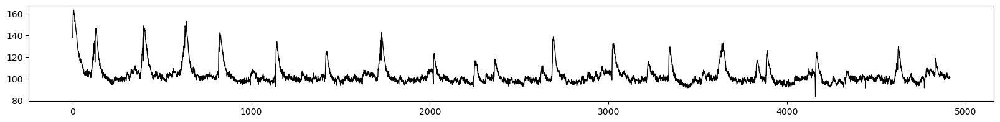

In [4]:
i = 5
data = np.load(blnraw[i])
fig, ax = plt.subplots(figsize= (20,2))
mean = np.apply_along_axis(np.mean, 0, data)
plt.plot(mean, linewidth = 1, c = 'k')
plt.savefig(Ffig + 'bln_mean.svg', transparent = True)
plt.show()

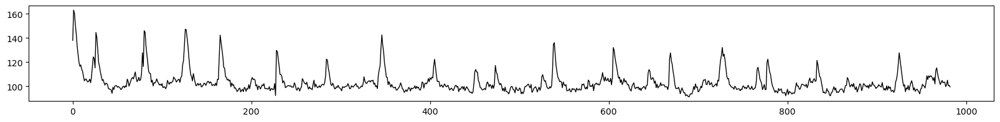

In [9]:
size = 5
i = 5
data = np.load(blnraw[i])
fig, ax = plt.subplots(figsize= (20,2))
mean = np.apply_along_axis(np.mean, 0, data)
plt.plot(mean[0::size], linewidth = 1, c = 'k')
#plt.savefig(Ffig + 'bln_mean.svg', transparent = True)
plt.show()


In [348]:
bln_index = 3682, 5407, 16, 4723, 859
0,50

(0, 50)

6227


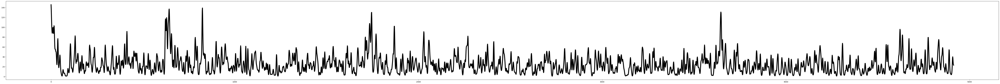

4193


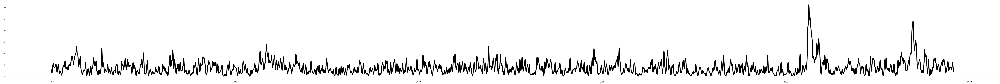

5045


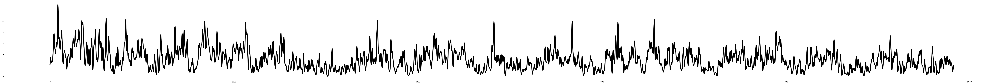

2159


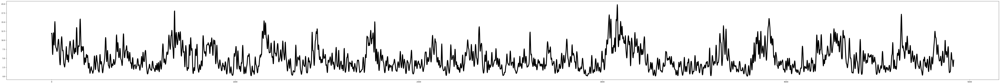

4564


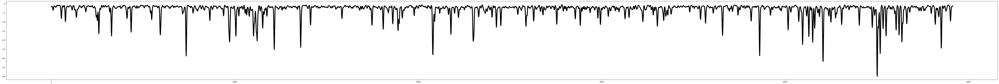

4811


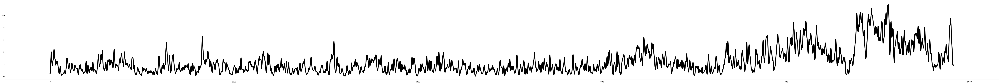

7322


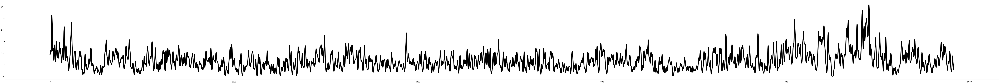

3321


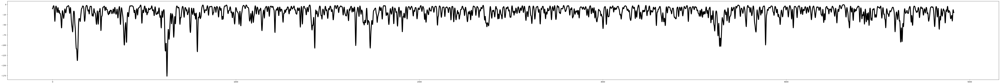

3003


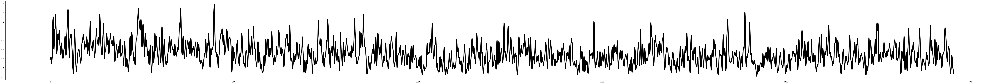

5417


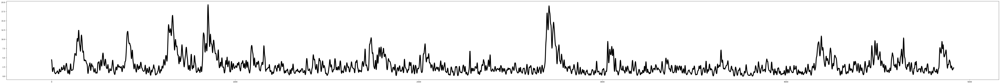

In [399]:
i = 5
data = np.load(blnraw[i])
#pick_me(bln_index, data, 'k')
plot_me(data, 'k')

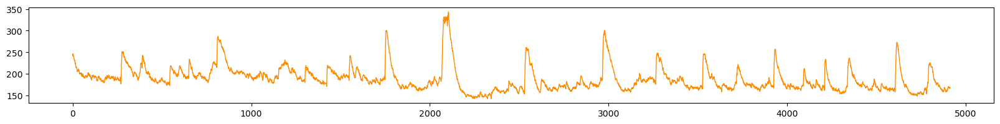

In [345]:
i = 8
data = np.load(p5raw[i])
fig, ax = plt.subplots(figsize= (20,2))
mean = np.apply_along_axis(np.mean, 0, data)
plt.plot(mean, linewidth = 1, c = 'darkorange')
plt.savefig(Ffig + 'p5_mean.svg', transparent = True)
plt.show()

In [286]:
p5_index = 948, 10786, 1726, 6261, 7883
0,300

948


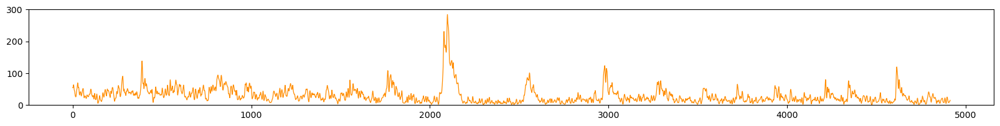

10786


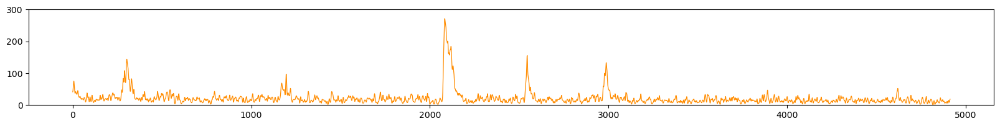

1726


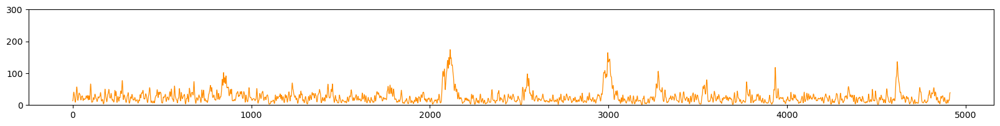

6261


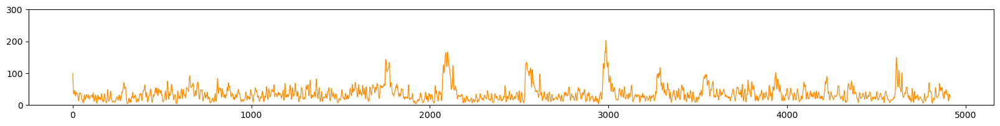

7883


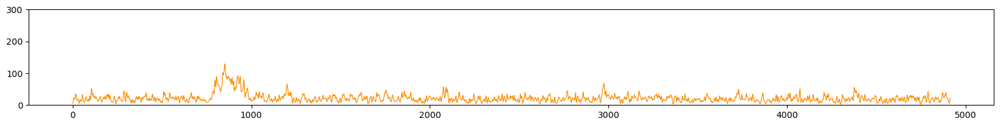

In [371]:
i = 8
data = np.load(p5raw[i])
#plot_me(data, 'darkorange')
pick_me(p5_index, data, 'darkorange')


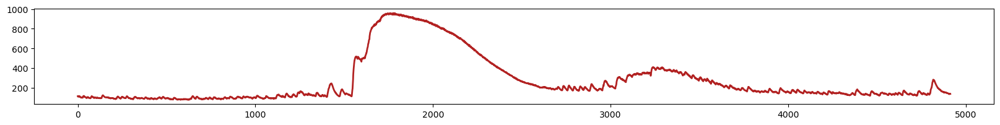

In [346]:
i = 8
data = np.load(p20raw[i])
fig, ax = plt.subplots(figsize= (20,2))
mean = np.apply_along_axis(np.mean, 0, data)
plt.plot(mean, linewidth = 2, c = 'firebrick')
plt.savefig(Ffig + 'p20_mean.svg', transparent = True)
plt.show()

In [311]:
p20_index = 824, 9376, 2734, 263, 4851
0,830

824


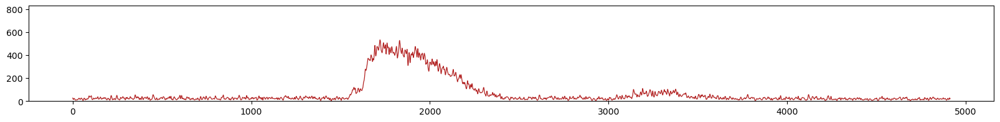

9376


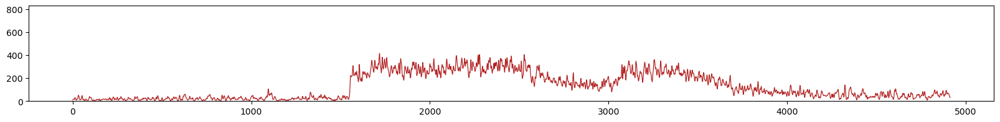

2734


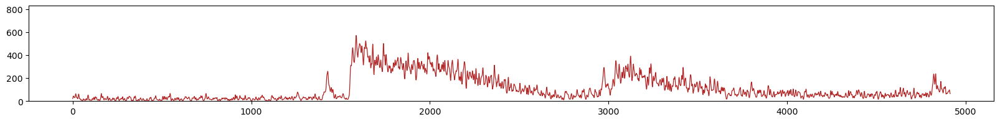

263


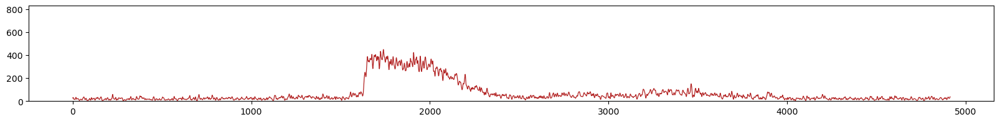

4851


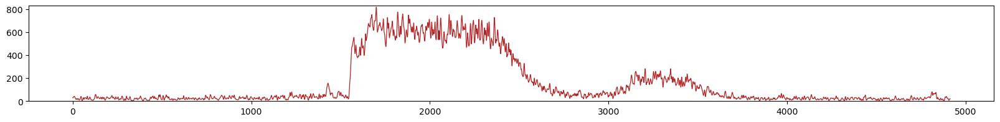

In [373]:
i = 8
data = np.load(p20raw[i])
#plot_me(data, 'firebrick')
pick_me(p20_index, data, 'firebrick')


In [79]:
from scipy.ndimage import gaussian_filter1d

def plot_me(data, col):
    for i in range(10):
        randval = np.random.randint(data.shape[0])
        print(randval)
        plt.figure(figsize = (100,8))
        dff = deltaff(data[randval], 0.05)
        y = gaussian_filter1d(dff, 2, axis = 0)
        #plt.ylim(0,300)
        plt.plot(y, c = col, linewidth = 5)
        plt.show()
        
        
def pick_me(index,data, col):
    count=0
    for i in index:
        print(i)
        plt.figure(figsize = (20,2))
        dff = deltaff(data[i], 0.1)
        y = gaussian_filter1d(dff, 2, axis = 0)
        plt.plot(y, c = col, linewidth = 0.9)
        plt.ylim(0,830)
        plt.savefig(Ffig + 'p20_trace_' + str(count) + '.svg', transparent = True)

        count+=1
        plt.show()
        
def deltaff(old_trace, percentile):
    mini = np.min(old_trace)
    trace = old_trace - np.min(old_trace)
    newtrace = trace
    baseline = np.quantile(trace, percentile, axis= 0)
    newtrace[np.where(trace <= baseline)] = 0 #set all values below baseline to 0
    pos_index = np.where(trace > baseline) #indeces of values above baseline
    newtrace[pos_index] = (trace[pos_index] - baseline)/baseline
    return(newtrace)

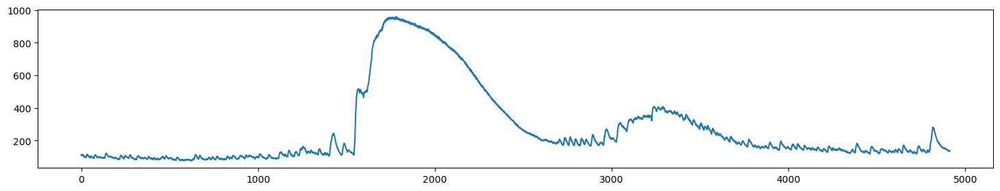

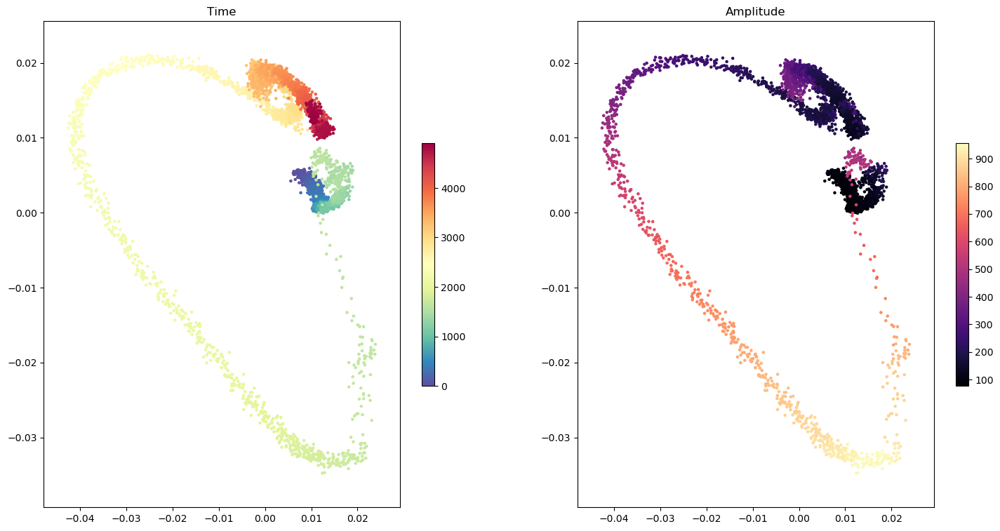

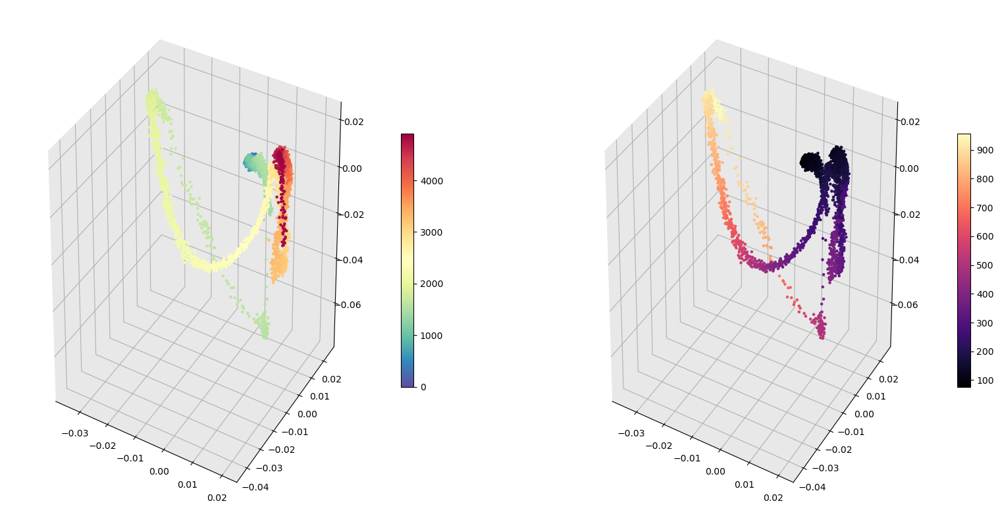

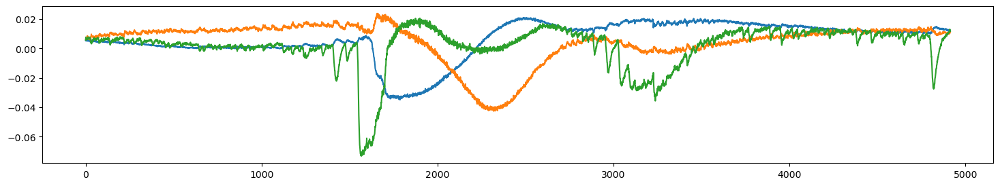

In [10]:
#matrix factorisation - time frames
#---------------------------------
i, n_components = 8, 4
p20 = np.load(p20raw[i])
#PLOT TRACE AVERAGE
fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, p20)
plt.plot(mean)

#NON-NEGATIVE MATRIX FACTORISATION
from sklearn import decomposition
pca = decomposition.PCA(n_components)
fit = pca.fit(p20) #Make matrix entirely positive
fig, axarr = plt.subplots(1,2, figsize= (18,9))
dotplot = axarr[0].scatter(fit.components_[2,:], fit.components_[1,:], c = np.linspace(0,fit.components_.shape[1], fit.components_.shape[1]), s = 5, alpha = 1, cmap = 'Spectral_r')
axarr[0].set_title('Time')
fig.colorbar(dotplot, ax=axarr[0], shrink = 0.5)
dotplot = axarr[1].scatter(fit.components_[2,:], fit.components_[1,:], c = mean, s = 5, alpha = 1, cmap = 'magma')
axarr[1].set_title('Amplitude')
fig.colorbar(dotplot, ax=axarr[1], shrink = 0.5)

from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize= (20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')
dotplot = ax.scatter3D(fit.components_[1,:],fit.components_[2,:],fit.components_[3,:], c = np.linspace(0,fit.components_.shape[1], fit.components_.shape[1]), s = 5, alpha = 1, cmap = 'Spectral_r')
ax.w_xaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_yaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_zaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
fig.colorbar(dotplot, shrink = 0.5)
ax = fig.add_subplot(1, 2, 2, projection='3d')
dotplot = ax.scatter3D(fit.components_[1,:],fit.components_[2,:],fit.components_[3,:], c = mean, s = 5, alpha = 1, cmap = 'magma')
ax.w_xaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_yaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_zaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
fig.colorbar(dotplot, shrink = 0.5)

fig, ax = plt.subplots(figsize= (18,3))
for i in range(3):
    plt.plot(fit.components_[i+1])
plt.show()

In [24]:
data.shape

(986, 4914)

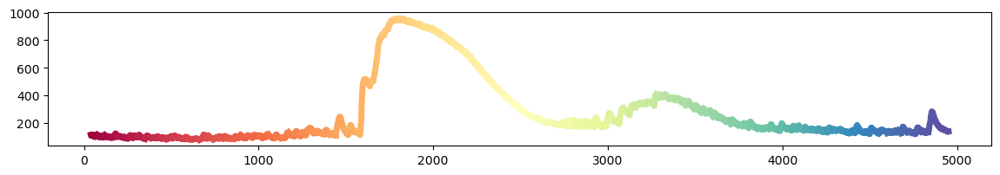

In [29]:

data = p20
mean = np.apply_along_axis(np.mean, 0, data)


window = adfn.window(30, mean.shape[0])[0]
data_list = list(range((np.int(mean.shape[0]/window))))
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.Spectral(np.linspace(0,1,len(data_list))))
fig, axarr = plt.subplots(figsize= (14,2))
count,count1=0,0
for e in range(np.int(mean.shape[0]/window)):
    sub_mean = mean[count:count+window]
    #n_components = sub_data.shape[1]
    #pca = decomposition.PCA(n_components)
    #fit = pca.fit(sub_data)
    #data_list[count1] = fit.explained_variance_ratio_

    count+=window
    xvals = np.arange(count, count+window)
    axarr.plot(xvals, sub_mean, linewidth = 5)


#for x in max_list[choose]: plt.axvline(x=x, c='orangered', linewidth = 1, linestyle= '--')
#for x in max_list[choose]: plt.axvline(x=x+window, c='grey', linewidth = 1.5, linestyle= '--')
#for x in max_list[choose]: plt.axvline(x=x-window, c='orange', linewidth = 1.5, linestyle= '--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

plt.savefig(Ffig + 'pca_seizure_mean.svg', transparent = True)
plt.show()


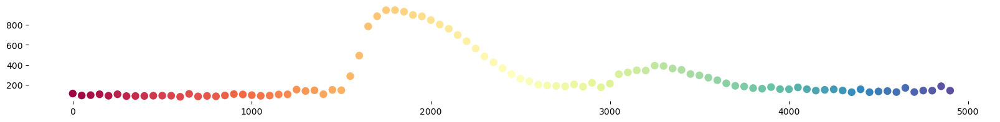

In [11]:
#CHOOSE FISH

data = p20
mean = np.apply_along_axis(np.mean, 0, data)

    
#PLOT MEAN DIST BY SEGMENTS
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm
fig, ax = plt.subplots(figsize= (20,2))

size = 50
#plt.scatter(np.arange(0, mean.shape[0],1)[0::size], mean[0::size], marker='o', linewidth = 2,s = 50, c = 'k')
plt.scatter(np.arange(0, mean.shape[0],1)[0::size], mean[0::size], marker='o', linewidth = 0,s = 80, c = np.linspace(0,fit.components_.shape[1], fit.components_.shape[1])[0::size], cmap = 'Spectral')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.savefig(Ffig + 'pca_seizure_mean.svg', transparent = True)
plt.show()

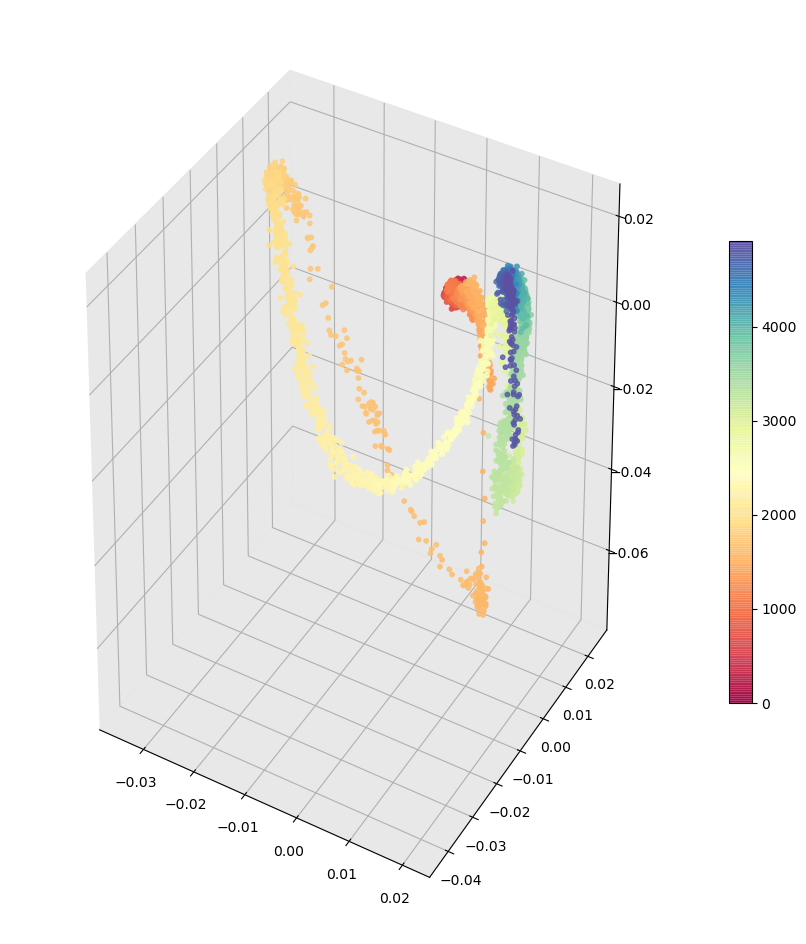

In [390]:
#matrix factorisation - time frames
#---------------------------------

from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize= (24,12))
ax = fig.add_subplot(1, 2, 1, projection='3d')
dotplot = ax.scatter3D(fit.components_[1,:],fit.components_[2,:],fit.components_[3,:], c = np.linspace(0,fit.components_.shape[1], fit.components_.shape[1]), s = 10, alpha = 0.8, cmap = 'Spectral')
ax.w_xaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_yaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_zaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
fig.colorbar(dotplot, shrink = 0.5)
plt.savefig(Ffig + 'pca_seizure_time.svg', transparent = True)
plt.show()


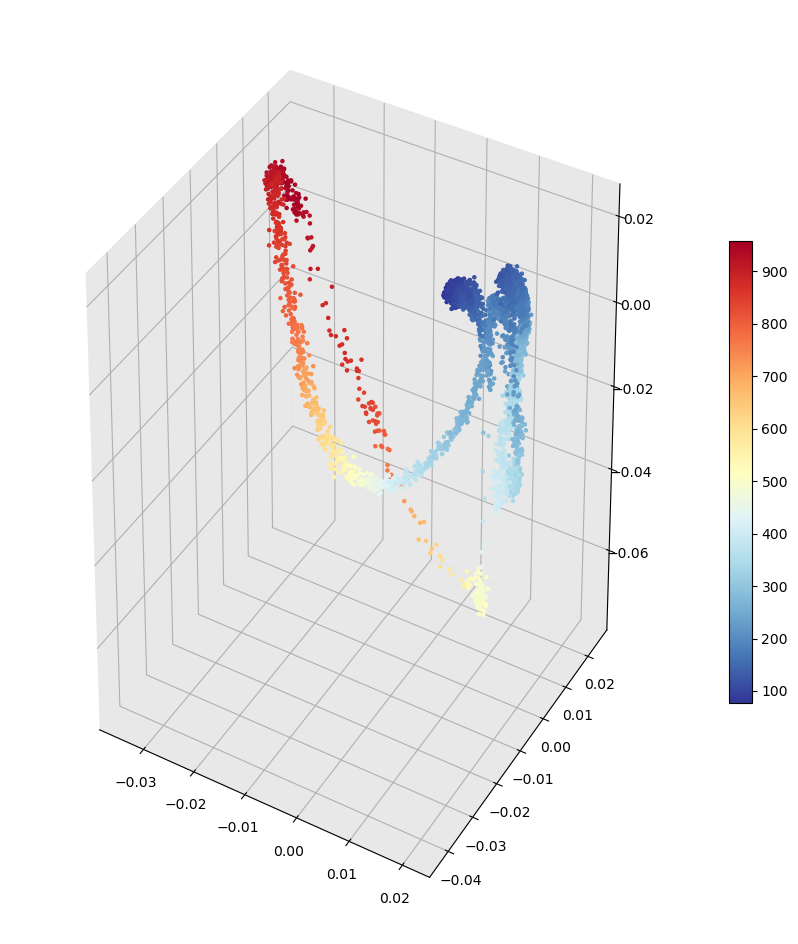

In [383]:
#matrix factorisation - time frames
#---------------------------------

#matrix factorisation - time frames
#---------------------------------


from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize= (24,12))
ax = fig.add_subplot(1, 2, 1, projection='3d')
dotplot = ax.scatter3D(fit.components_[1,:],fit.components_[2,:],fit.components_[3,:], c = mean, s = 5, alpha = 1, cmap = 'RdYlBu_r')
ax.w_xaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_yaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_zaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
fig.colorbar(dotplot, shrink = 0.5)
plt.savefig(Ffig + 'pca_seizure_amp.svg', transparent = True)
plt.show()


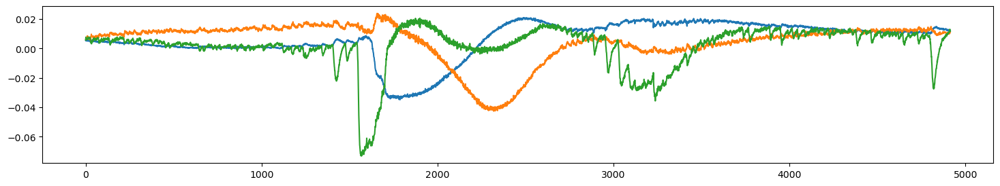

In [392]:
fig, ax = plt.subplots(figsize= (18,3))
cols = ['']
for i in range(3):
    plt.plot(fit.components_[i+1])
plt.savefig(Ffig + 'pca_seizure_components.svg', transparent = True)

plt.show()

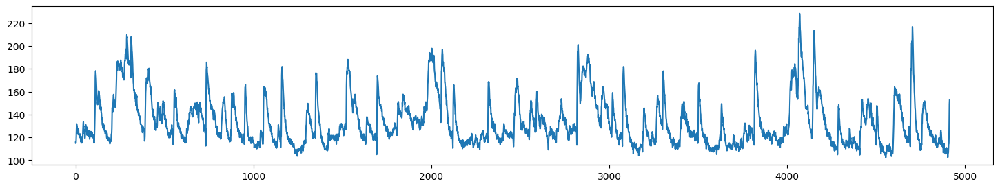

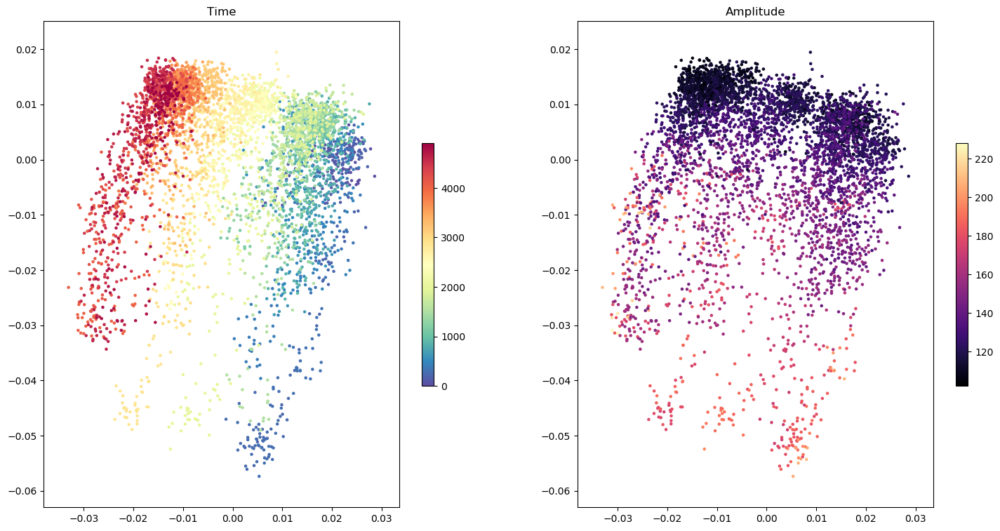

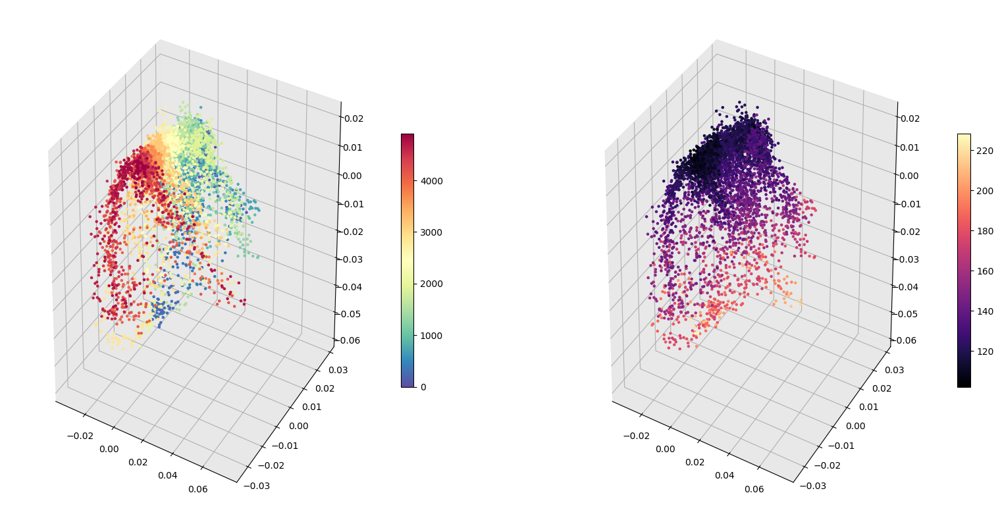

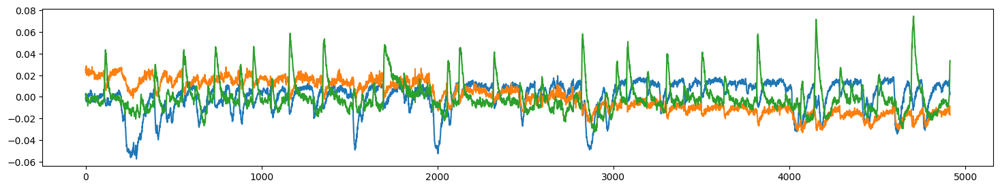

In [14]:
#matrix factorisation - time frames
#---------------------------------
i, n_components = 9, 4
p5 = np.load(p5raw[i])

#PLOT TRACE AVERAGE
fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, p5)
plt.plot(mean)

#NON-NEGATIVE MATRIX FACTORISATION
from sklearn import decomposition
pca = decomposition.PCA(n_components)
fit = pca.fit(p5) #Make matrix entirely positive
fig, axarr = plt.subplots(1,2, figsize= (18,9))
dotplot = axarr[0].scatter(fit.components_[2,:], fit.components_[1,:], c = np.linspace(0,fit.components_.shape[1], fit.components_.shape[1]), s = 5, alpha = 1, cmap = 'Spectral_r')
axarr[0].set_title('Time')
fig.colorbar(dotplot, ax=axarr[0], shrink = 0.5)
dotplot = axarr[1].scatter(fit.components_[2,:], fit.components_[1,:], c = mean, s = 5, alpha = 1, cmap = 'magma')
axarr[1].set_title('Amplitude')
fig.colorbar(dotplot, ax=axarr[1], shrink = 0.5)

from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize= (20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')
dotplot = ax.scatter3D(fit.components_[3,:],fit.components_[2,:],fit.components_[1,:], c = np.linspace(0,fit.components_.shape[1], fit.components_.shape[1]), s = 5, alpha = 1, cmap = 'Spectral_r')
ax.w_xaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_yaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_zaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
fig.colorbar(dotplot, shrink = 0.5)
ax = fig.add_subplot(1, 2, 2, projection='3d')
dotplot = ax.scatter3D(fit.components_[3,:],fit.components_[2,:],fit.components_[1,:], c = mean, s = 5, alpha = 1, cmap = 'magma')
ax.w_xaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_yaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_zaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
fig.colorbar(dotplot, shrink = 0.5)

fig, ax = plt.subplots(figsize= (18,3))
for i in range(3):
    plt.plot(fit.components_[i+1])
plt.show()

In [3]:
#matrix factorisation - time frames
#---------------------------------
i, n_components = 9, 4
p20 = np.load(p20raw[i])

#PLOT TRACE AVERAGE
fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, p20)
plt.plot(mean)

#NON-NEGATIVE MATRIX FACTORISATION
from sklearn import decomposition
pca = decomposition.PCA(n_components)
fit = pca.fit(p20) #Make matrix entirely positive
fig, axarr = plt.subplots(1,2, figsize= (18,9))
dotplot = axarr[0].scatter(fit.components_[2,:], fit.components_[1,:], c = np.linspace(0,fit.components_.shape[1], fit.components_.shape[1]), s = 5, alpha = 1, cmap = 'Spectral_r')
axarr[0].set_title('Time')
fig.colorbar(dotplot, ax=axarr[0], shrink = 0.5)
dotplot = axarr[1].scatter(fit.components_[2,:], fit.components_[1,:], c = mean, s = 5, alpha = 1, cmap = 'magma')
axarr[1].set_title('Amplitude')
fig.colorbar(dotplot, ax=axarr[1], shrink = 0.5)

from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize= (20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')
dotplot = ax.scatter3D(fit.components_[3,:],fit.components_[2,:],fit.components_[1,:], c = np.linspace(0,fit.components_.shape[1], fit.components_.shape[1]), s = 5, alpha = 1, cmap = 'Spectral_r')
ax.w_xaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_yaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_zaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
fig.colorbar(dotplot, shrink = 0.5)
ax = fig.add_subplot(1, 2, 2, projection='3d')
dotplot = ax.scatter3D(fit.components_[3,:],fit.components_[2,:],fit.components_[1,:], c = mean, s = 5, alpha = 1, cmap = 'magma')
ax.w_xaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_yaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
ax.w_zaxis.set_pane_color((0.9, 0.9, 0.9, 0.9))
fig.colorbar(dotplot, shrink = 0.5)

fig, ax = plt.subplots(figsize= (18,3))
for i in range(3):
    plt.plot(fit.components_[i+1])
plt.show()

NameError: name 'p20raw' is not defined

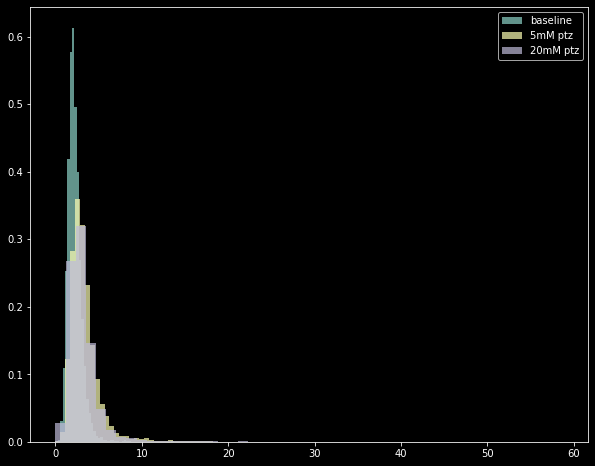

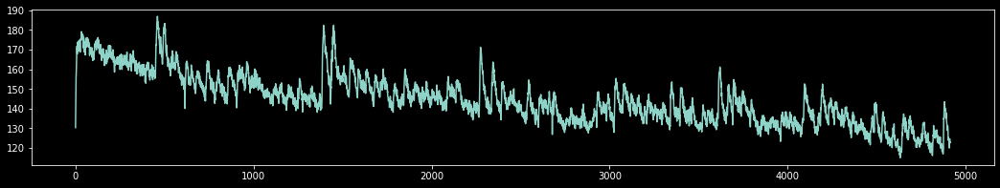

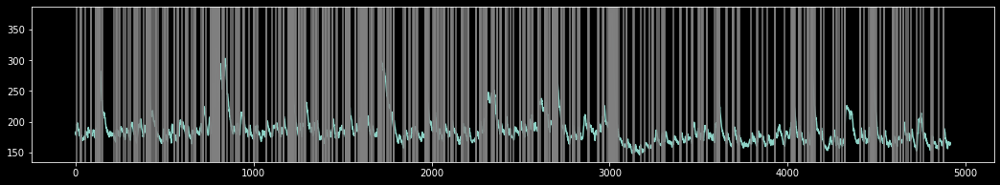

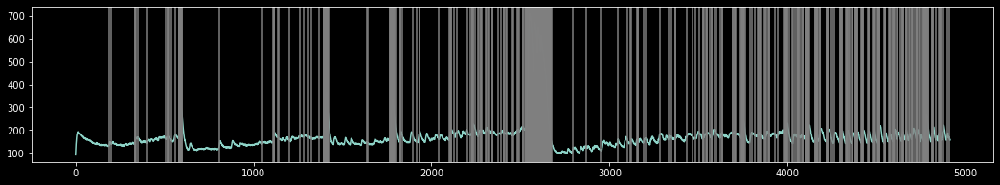

In [25]:
#NNMF - euclidean distance
#-------------------------------------
i, n_components = 0, 10
bln = np.load(blnraw[i])
p5 = np.load(p5raw[i])
p20 = np.load(p20raw[i])

#Find factors
#-------------------------------
from sklearn import decomposition
fit, dist = list(range(3)) , list(range(3)) 
bnmf = decomposition.NMF(n_components) #Define decomposition
p5nmf = decomposition.NMF(n_components) #Define decomposition
pnmf = decomposition.NMF(n_components) #Define decomposition
fit[0], fit[1], fit[2] = bnmf.fit(bln - np.min(bln)), p5nmf.fit(p5 - np.min(p5)) ,pnmf.fit(p20 - np.min(p20)) #Perform NMF on positive matrix

#Calculate euclidean distance distribution
#--------------------------------------------
dist[0], dist[1], dist[2] = np.zeros((fit[0].components_.shape[1])-1), np.zeros((fit[1].components_.shape[1])-1),np.zeros((fit[2].components_.shape[1])-1) #empty distribution
count=0
problist = list(range(3))
for e in range(len(dist)):
    for i in range(dist[e].shape[0]-1): 
        dist[e][i] = np.linalg.norm(fit[count].components_[:,i]-fit[count].components_[:,i+1]) #euclidean distance distribution
    count+=1
    
fig, ax = plt.subplots(figsize = (10,8))
ax.hist(dist[0], bins = 50 ,alpha = 0.7, density = True, label = 'baseline')
ax.hist(dist[1], bins = 50, alpha = 0.7, density = True, label = '5mM ptz')
ax.hist(dist[2], bins = 50, alpha = 0.7, density = True, label = '20mM ptz')
ax.legend()
plt.show()

#DEFINE CUTOFF 
thresh = 99
cutoff = np.percentile(dist[0], thresh)
when = list(range(2))
fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, bln)
plt.plot(mean)
plt.show()
plotlist=[p5,p20]
for i in range(2):
    when[i] = np.where(dist[i+1] > cutoff)[0]
    fig, ax = plt.subplots(figsize= (18,3))
    mean = np.apply_along_axis(np.mean, 0, plotlist[i])
    plt.plot(mean)
    for x in when[i]: plt.axvline(x=x, c='gray')
    plt.show()

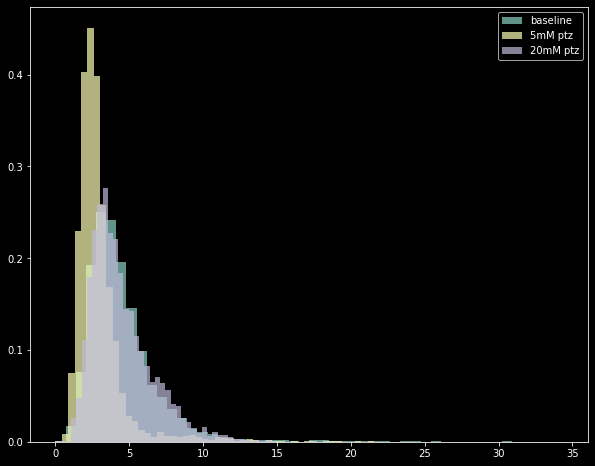

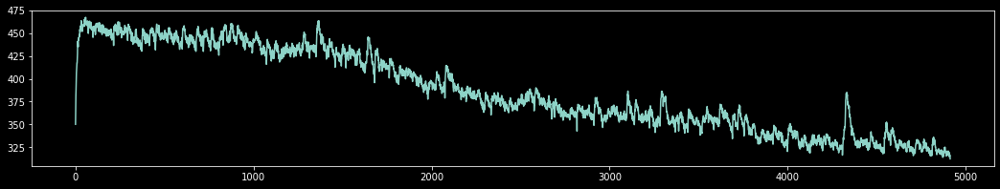

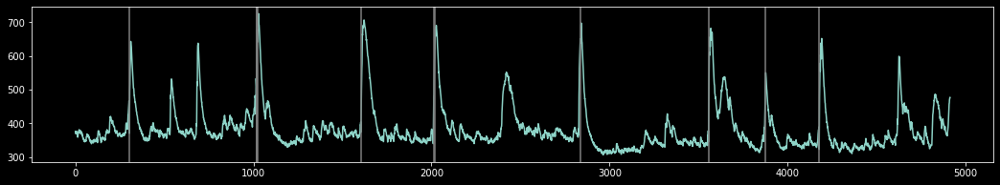

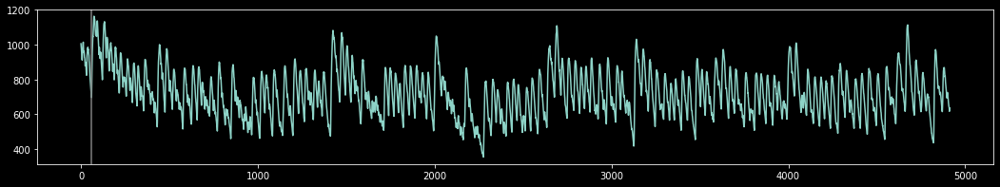

In [24]:
#NNMF - euclidean distance
#-------------------------------------
i, n_components = 1, 10
bln = np.load(blnraw[i])
p5 = np.load(p5raw[i])
p20 = np.load(p20raw[i])

#Find factors
#-------------------------------
from sklearn import decomposition
fit, dist = list(range(3)) , list(range(3)) 
bnmf = decomposition.NMF(n_components) #Define decomposition
p5nmf = decomposition.NMF(n_components) #Define decomposition
pnmf = decomposition.NMF(n_components) #Define decomposition
fit[0], fit[1], fit[2] = bnmf.fit(bln - np.min(bln)), p5nmf.fit(p5 - np.min(p5)) ,pnmf.fit(p20 - np.min(p20)) #Perform NMF on positive matrix

#Calculate euclidean distance distribution
#--------------------------------------------
dist[0], dist[1], dist[2] = np.zeros((fit[0].components_.shape[1])-1), np.zeros((fit[1].components_.shape[1])-1),np.zeros((fit[2].components_.shape[1])-1) #empty distribution
count=0
problist = list(range(3))
for e in range(len(dist)):
    for i in range(dist[e].shape[0]-1): 
        dist[e][i] = np.linalg.norm(fit[count].components_[:,i]-fit[count].components_[:,i+1]) #euclidean distance distribution
    count+=1
    
fig, ax = plt.subplots(figsize = (10,8))
ax.hist(dist[0], bins = 50 ,alpha = 0.7, density = True, label = 'baseline')
ax.hist(dist[1], bins = 50, alpha = 0.7, density = True, label = '5mM ptz')
ax.hist(dist[2], bins = 50, alpha = 0.7, density = True, label = '20mM ptz')
ax.legend()
plt.show()

#DEFINE CUTOFF 
thresh = 99
cutoff = np.percentile(dist[0], thresh)
when = list(range(2))
fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, bln)
plt.plot(mean)
plt.show()
plotlist=[p5,p20]
for i in range(2):
    when[i] = np.where(dist[i+1] > cutoff)[0]
    fig, ax = plt.subplots(figsize= (18,3))
    mean = np.apply_along_axis(np.mean, 0, plotlist[i])
    plt.plot(mean)
    for x in when[i]: plt.axvline(x=x, c='gray')
    plt.show()

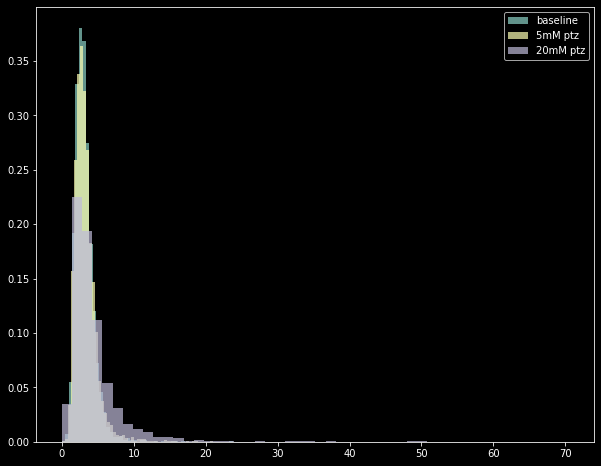

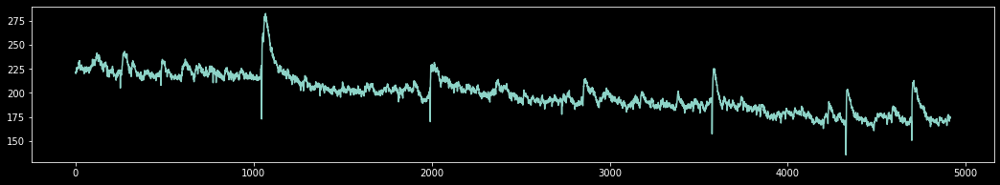

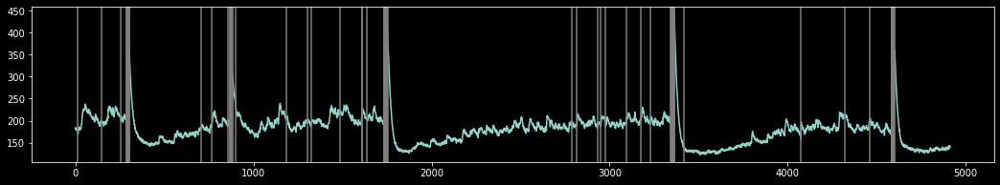

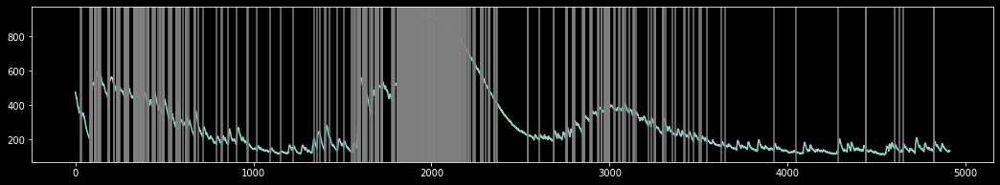

In [23]:
#NNMF - euclidean distance
#-------------------------------------
i, n_components = 2, 10
bln = np.load(blnraw[i])
p5 = np.load(p5raw[i])
p20 = np.load(p20raw[i])

#Find factors
#-------------------------------
from sklearn import decomposition
fit, dist = list(range(3)) , list(range(3)) 
bnmf = decomposition.NMF(n_components) #Define decomposition
p5nmf = decomposition.NMF(n_components) #Define decomposition
pnmf = decomposition.NMF(n_components) #Define decomposition
fit[0], fit[1], fit[2] = bnmf.fit(bln - np.min(bln)), p5nmf.fit(p5 - np.min(p5)) ,pnmf.fit(p20 - np.min(p20)) #Perform NMF on positive matrix

#Calculate euclidean distance distribution
#--------------------------------------------
dist[0], dist[1], dist[2] = np.zeros((fit[0].components_.shape[1])-1), np.zeros((fit[1].components_.shape[1])-1),np.zeros((fit[2].components_.shape[1])-1) #empty distribution
count=0
problist = list(range(3))
for e in range(len(dist)):
    for i in range(dist[e].shape[0]-1): 
        dist[e][i] = np.linalg.norm(fit[count].components_[:,i]-fit[count].components_[:,i+1]) #euclidean distance distribution
    count+=1
    
fig, ax = plt.subplots(figsize = (10,8))
ax.hist(dist[0], bins = 50 ,alpha = 0.7, density = True, label = 'baseline')
ax.hist(dist[1], bins = 50, alpha = 0.7, density = True, label = '5mM ptz')
ax.hist(dist[2], bins = 50, alpha = 0.7, density = True, label = '20mM ptz')
ax.legend()
plt.show()

#DEFINE CUTOFF 
thresh = 99
cutoff = np.percentile(dist[0], thresh)
when = list(range(2))
fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, bln)
plt.plot(mean)
plt.show()
plotlist=[p5,p20]
for i in range(2):
    when[i] = np.where(dist[i+1] > cutoff)[0]
    fig, ax = plt.subplots(figsize= (18,3))
    mean = np.apply_along_axis(np.mean, 0, plotlist[i])
    plt.plot(mean)
    for x in when[i]: plt.axvline(x=x, c='gray')
    plt.show()

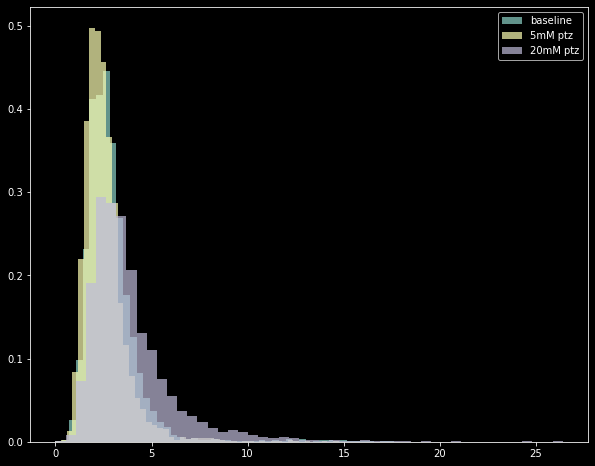

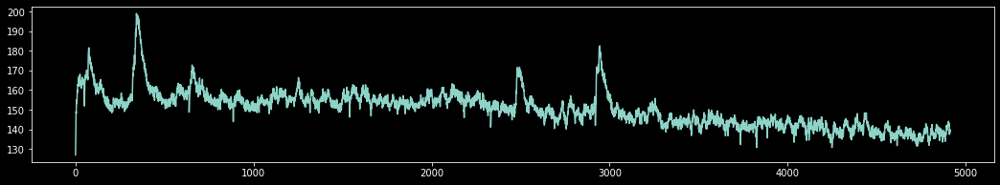

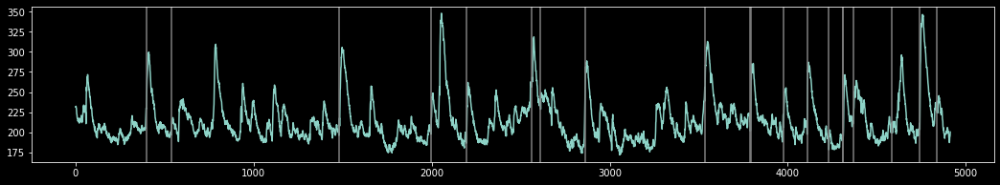

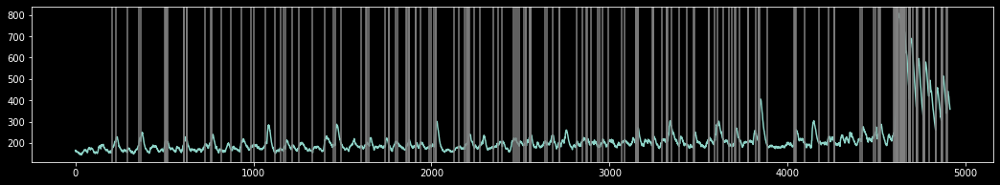

In [22]:
#NNMF - euclidean distance
#-------------------------------------
i, n_components = 3, 10
bln = np.load(blnraw[i])
p5 = np.load(p5raw[i])
p20 = np.load(p20raw[i])

#Find factors
#-------------------------------
from sklearn import decomposition
fit, dist = list(range(3)) , list(range(3)) 
bnmf = decomposition.NMF(n_components) #Define decomposition
p5nmf = decomposition.NMF(n_components) #Define decomposition
pnmf = decomposition.NMF(n_components) #Define decomposition
fit[0], fit[1], fit[2] = bnmf.fit(bln - np.min(bln)), p5nmf.fit(p5 - np.min(p5)) ,pnmf.fit(p20 - np.min(p20)) #Perform NMF on positive matrix

#Calculate euclidean distance distribution
#--------------------------------------------
dist[0], dist[1], dist[2] = np.zeros((fit[0].components_.shape[1])-1), np.zeros((fit[1].components_.shape[1])-1),np.zeros((fit[2].components_.shape[1])-1) #empty distribution
count=0
problist = list(range(3))
for e in range(len(dist)):
    for i in range(dist[e].shape[0]-1): 
        dist[e][i] = np.linalg.norm(fit[count].components_[:,i]-fit[count].components_[:,i+1]) #euclidean distance distribution
    count+=1
    
fig, ax = plt.subplots(figsize = (10,8))
ax.hist(dist[0], bins = 50 ,alpha = 0.7, density = True, label = 'baseline')
ax.hist(dist[1], bins = 50, alpha = 0.7, density = True, label = '5mM ptz')
ax.hist(dist[2], bins = 50, alpha = 0.7, density = True, label = '20mM ptz')
ax.legend()
plt.show()

#DEFINE CUTOFF 
thresh = 99
cutoff = np.percentile(dist[0], thresh)
when = list(range(2))
fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, bln)
plt.plot(mean)
plt.show()
plotlist=[p5,p20]
for i in range(2):
    when[i] = np.where(dist[i+1] > cutoff)[0]
    fig, ax = plt.subplots(figsize= (18,3))
    mean = np.apply_along_axis(np.mean, 0, plotlist[i])
    plt.plot(mean)
    for x in when[i]: plt.axvline(x=x, c='gray')
    plt.show()

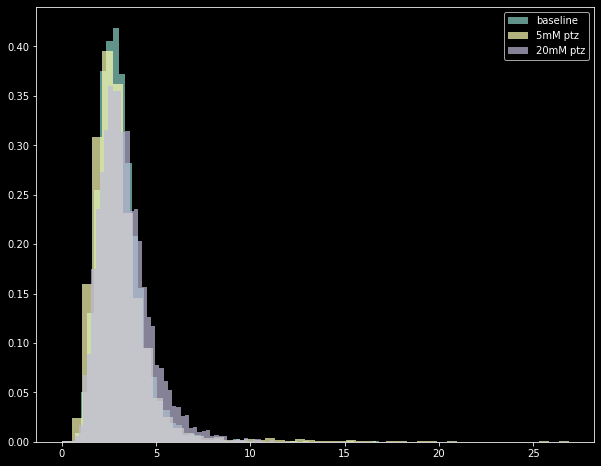

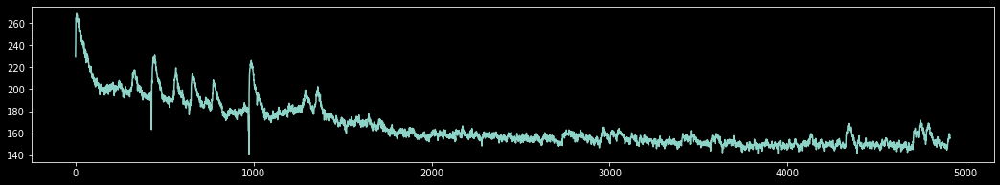

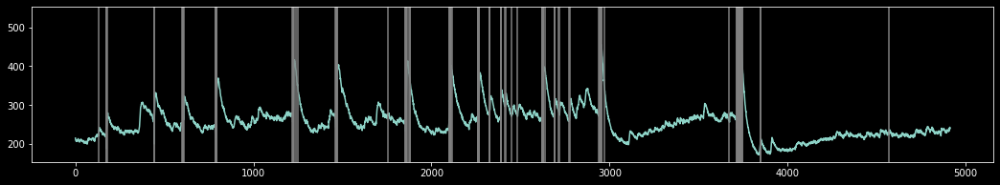

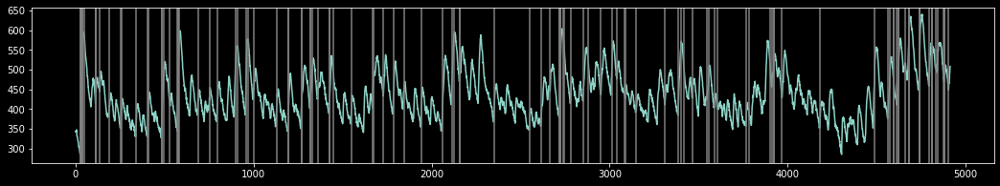

In [21]:
#NNMF - euclidean distance
#-------------------------------------
i, n_components = 4, 10
bln = np.load(blnraw[i])
p5 = np.load(p5raw[i])
p20 = np.load(p20raw[i])

#Find factors
#-------------------------------
from sklearn import decomposition
fit, dist = list(range(3)) , list(range(3)) 
bnmf = decomposition.NMF(n_components) #Define decomposition
p5nmf = decomposition.NMF(n_components) #Define decomposition
pnmf = decomposition.NMF(n_components) #Define decomposition
fit[0], fit[1], fit[2] = bnmf.fit(bln - np.min(bln)), p5nmf.fit(p5 - np.min(p5)) ,pnmf.fit(p20 - np.min(p20)) #Perform NMF on positive matrix

#Calculate euclidean distance distribution
#--------------------------------------------
dist[0], dist[1], dist[2] = np.zeros((fit[0].components_.shape[1])-1), np.zeros((fit[1].components_.shape[1])-1),np.zeros((fit[2].components_.shape[1])-1) #empty distribution
count=0
problist = list(range(3))
for e in range(len(dist)):
    for i in range(dist[e].shape[0]-1): 
        dist[e][i] = np.linalg.norm(fit[count].components_[:,i]-fit[count].components_[:,i+1]) #euclidean distance distribution
    count+=1
    
fig, ax = plt.subplots(figsize = (10,8))
ax.hist(dist[0], bins = 50 ,alpha = 0.7, density = True, label = 'baseline')
ax.hist(dist[1], bins = 50, alpha = 0.7, density = True, label = '5mM ptz')
ax.hist(dist[2], bins = 50, alpha = 0.7, density = True, label = '20mM ptz')
ax.legend()
plt.show()

#DEFINE CUTOFF 
thresh = 99
cutoff = np.percentile(dist[0], thresh)
when = list(range(2))
fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, bln)
plt.plot(mean)
plt.show()
plotlist=[p5,p20]
for i in range(2):
    when[i] = np.where(dist[i+1] > cutoff)[0]
    fig, ax = plt.subplots(figsize= (18,3))
    mean = np.apply_along_axis(np.mean, 0, plotlist[i])
    plt.plot(mean)
    for x in when[i]: plt.axvline(x=x, c='gray')
    plt.show()

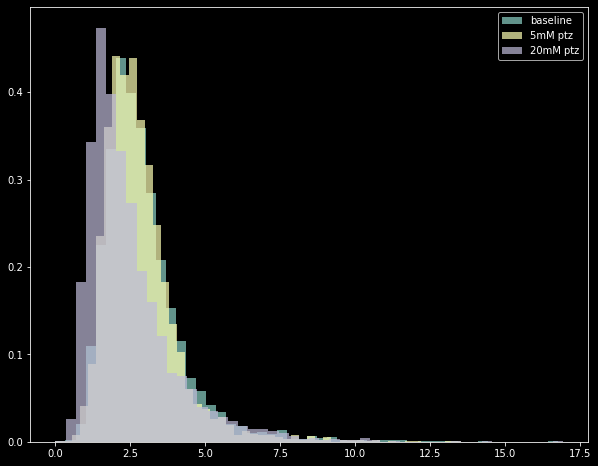

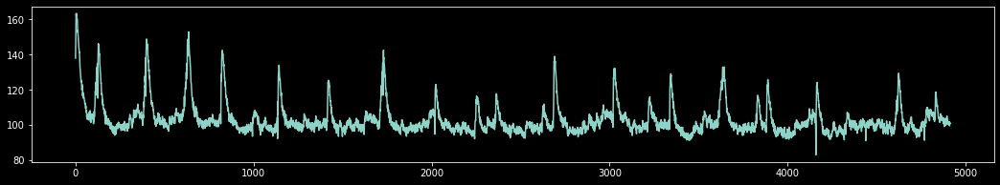

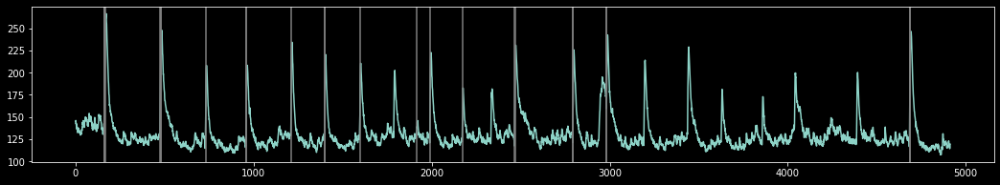

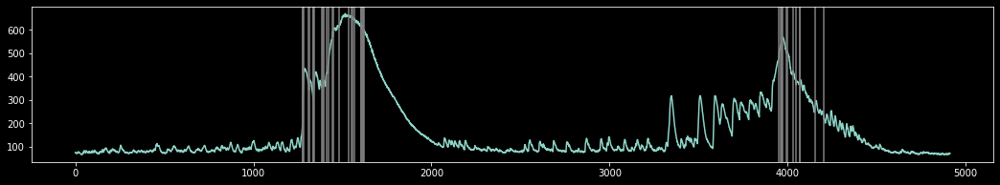

In [20]:
#NNMF - euclidean distance
#-------------------------------------
i, n_components = 5, 10
bln = np.load(blnraw[i])
p5 = np.load(p5raw[i])
p20 = np.load(p20raw[i])

#Find factors
#-------------------------------
from sklearn import decomposition
fit, dist = list(range(3)) , list(range(3)) 
bnmf = decomposition.NMF(n_components) #Define decomposition
p5nmf = decomposition.NMF(n_components) #Define decomposition
pnmf = decomposition.NMF(n_components) #Define decomposition
fit[0], fit[1], fit[2] = bnmf.fit(bln - np.min(bln)), p5nmf.fit(p5 - np.min(p5)) ,pnmf.fit(p20 - np.min(p20)) #Perform NMF on positive matrix

#Calculate euclidean distance distribution
#--------------------------------------------
dist[0], dist[1], dist[2] = np.zeros((fit[0].components_.shape[1])-1), np.zeros((fit[1].components_.shape[1])-1),np.zeros((fit[2].components_.shape[1])-1) #empty distribution
count=0
problist = list(range(3))
for e in range(len(dist)):
    for i in range(dist[e].shape[0]-1): 
        dist[e][i] = np.linalg.norm(fit[count].components_[:,i]-fit[count].components_[:,i+1]) #euclidean distance distribution
    count+=1
    
fig, ax = plt.subplots(figsize = (10,8))
ax.hist(dist[0], bins = 50 ,alpha = 0.7, density = True, label = 'baseline')
ax.hist(dist[1], bins = 50, alpha = 0.7, density = True, label = '5mM ptz')
ax.hist(dist[2], bins = 50, alpha = 0.7, density = True, label = '20mM ptz')
ax.legend()
plt.show()

#DEFINE CUTOFF 
thresh = 99
cutoff = np.percentile(dist[0], thresh)
when = list(range(2))
fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, bln)
plt.plot(mean)
plt.show()
plotlist=[p5,p20]
for i in range(2):
    when[i] = np.where(dist[i+1] > cutoff)[0]
    fig, ax = plt.subplots(figsize= (18,3))
    mean = np.apply_along_axis(np.mean, 0, plotlist[i])
    plt.plot(mean)
    for x in when[i]: plt.axvline(x=x, c='gray')
    plt.show()

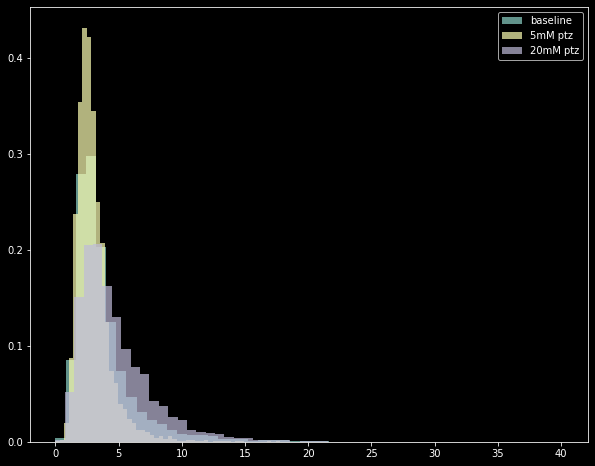

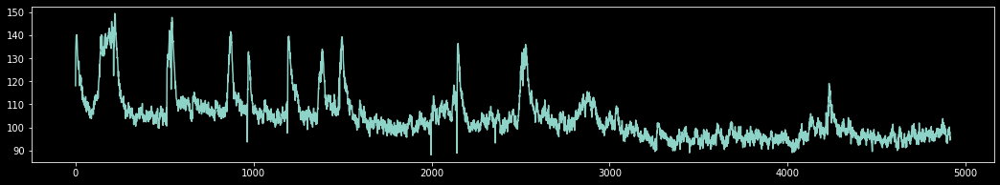

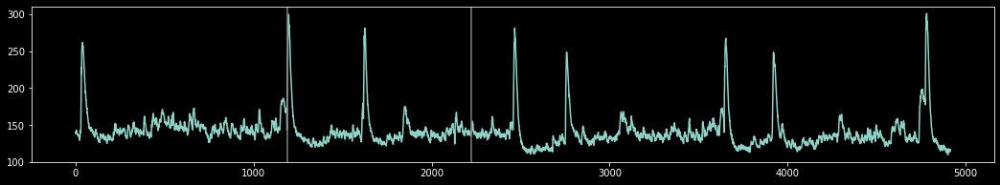

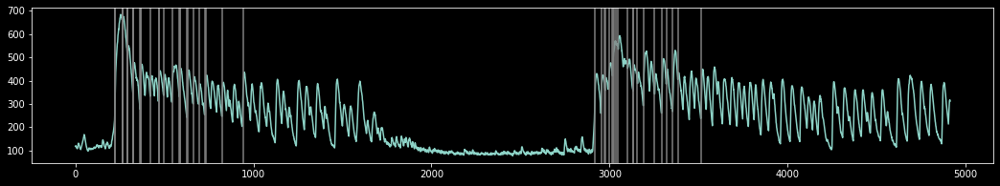

In [19]:
#NNMF - euclidean distance
#-------------------------------------
i, n_components = 6, 10
bln = np.load(blnraw[i])
p5 = np.load(p5raw[i])
p20 = np.load(p20raw[i])

#Find factors
#-------------------------------
from sklearn import decomposition
fit, dist = list(range(3)) , list(range(3)) 
bnmf = decomposition.NMF(n_components) #Define decomposition
p5nmf = decomposition.NMF(n_components) #Define decomposition
pnmf = decomposition.NMF(n_components) #Define decomposition
fit[0], fit[1], fit[2] = bnmf.fit(bln - np.min(bln)), p5nmf.fit(p5 - np.min(p5)) ,pnmf.fit(p20 - np.min(p20)) #Perform NMF on positive matrix

#Calculate euclidean distance distribution
#--------------------------------------------
dist[0], dist[1], dist[2] = np.zeros((fit[0].components_.shape[1])-1), np.zeros((fit[1].components_.shape[1])-1),np.zeros((fit[2].components_.shape[1])-1) #empty distribution
count=0
problist = list(range(3))
for e in range(len(dist)):
    for i in range(dist[e].shape[0]-1): 
        dist[e][i] = np.linalg.norm(fit[count].components_[:,i]-fit[count].components_[:,i+1]) #euclidean distance distribution
    count+=1
    
fig, ax = plt.subplots(figsize = (10,8))
ax.hist(dist[0], bins = 50 ,alpha = 0.7, density = True, label = 'baseline')
ax.hist(dist[1], bins = 50, alpha = 0.7, density = True, label = '5mM ptz')
ax.hist(dist[2], bins = 50, alpha = 0.7, density = True, label = '20mM ptz')
ax.legend()
plt.show()

#DEFINE CUTOFF 
thresh = 99
cutoff = np.percentile(dist[0], thresh)
when = list(range(2))
fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, bln)
plt.plot(mean)
plt.show()
plotlist=[p5,p20]
for i in range(2):
    when[i] = np.where(dist[i+1] > cutoff)[0]
    fig, ax = plt.subplots(figsize= (18,3))
    mean = np.apply_along_axis(np.mean, 0, plotlist[i])
    plt.plot(mean)
    for x in when[i]: plt.axvline(x=x, c='gray')
    plt.show()

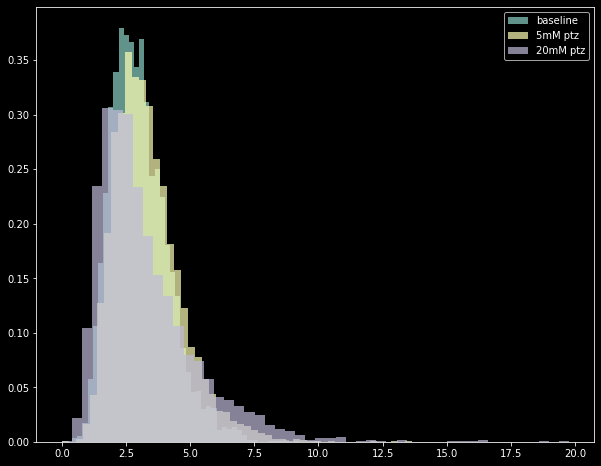

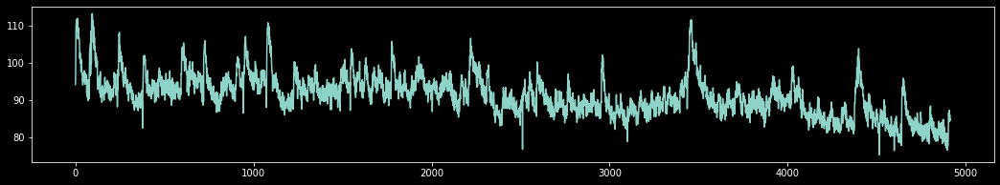

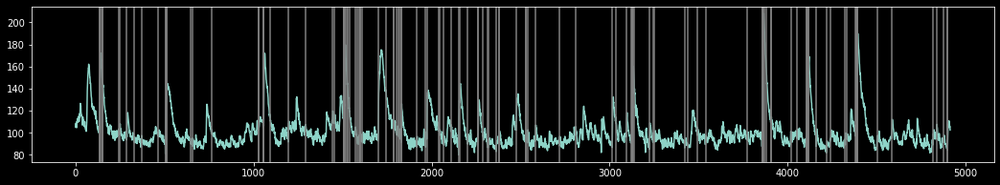

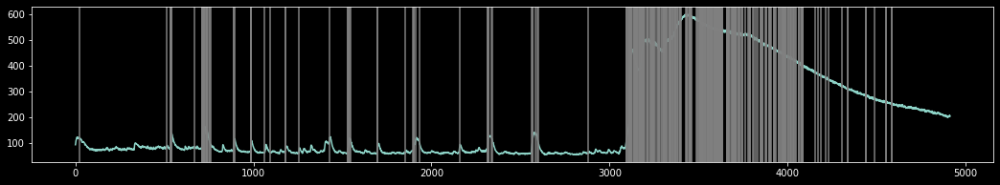

In [18]:
#NNMF - euclidean distance
#-------------------------------------
i, n_components = 7, 10
bln = np.load(blnraw[i])
p5 = np.load(p5raw[i])
p20 = np.load(p20raw[i])

#Find factors
#-------------------------------
from sklearn import decomposition
fit, dist = list(range(3)) , list(range(3)) 
bnmf = decomposition.NMF(n_components) #Define decomposition
p5nmf = decomposition.NMF(n_components) #Define decomposition
pnmf = decomposition.NMF(n_components) #Define decomposition
fit[0], fit[1], fit[2] = bnmf.fit(bln - np.min(bln)), p5nmf.fit(p5 - np.min(p5)) ,pnmf.fit(p20 - np.min(p20)) #Perform NMF on positive matrix

#Calculate euclidean distance distribution
#--------------------------------------------
dist[0], dist[1], dist[2] = np.zeros((fit[0].components_.shape[1])-1), np.zeros((fit[1].components_.shape[1])-1),np.zeros((fit[2].components_.shape[1])-1) #empty distribution
count=0
problist = list(range(3))
for e in range(len(dist)):
    for i in range(dist[e].shape[0]-1): 
        dist[e][i] = np.linalg.norm(fit[count].components_[:,i]-fit[count].components_[:,i+1]) #euclidean distance distribution
    count+=1
    
fig, ax = plt.subplots(figsize = (10,8))
ax.hist(dist[0], bins = 50 ,alpha = 0.7, density = True, label = 'baseline')
ax.hist(dist[1], bins = 50, alpha = 0.7, density = True, label = '5mM ptz')
ax.hist(dist[2], bins = 50, alpha = 0.7, density = True, label = '20mM ptz')
ax.legend()
plt.show()

#DEFINE CUTOFF 
thresh = 99
cutoff = np.percentile(dist[0], thresh)
when = list(range(2))
fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, bln)
plt.plot(mean)
plt.show()
plotlist=[p5,p20]
for i in range(2):
    when[i] = np.where(dist[i+1] > cutoff)[0]
    fig, ax = plt.subplots(figsize= (18,3))
    mean = np.apply_along_axis(np.mean, 0, plotlist[i])
    plt.plot(mean)
    for x in when[i]: plt.axvline(x=x, c='gray')
    plt.show()

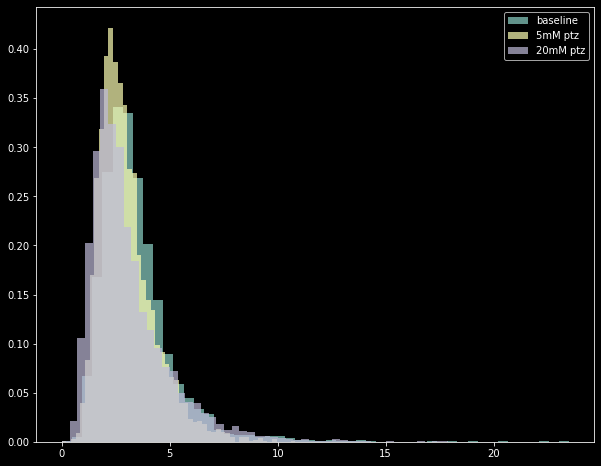

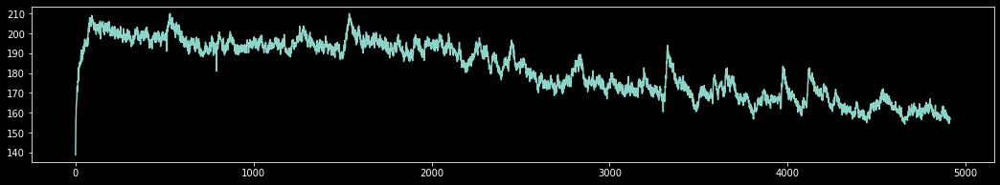

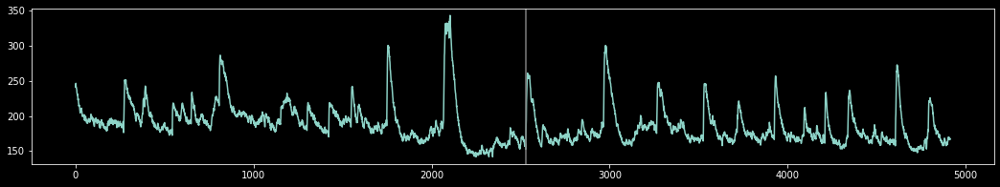

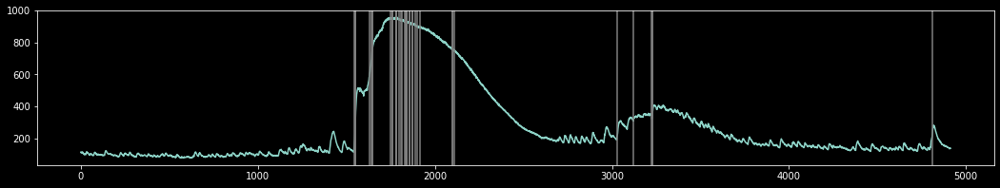

In [17]:
#NNMF - euclidean distance
#-------------------------------------
i, n_components = 8, 10
bln = np.load(blnraw[i])
p5 = np.load(p5raw[i])
p20 = np.load(p20raw[i])

#Find factors
#-------------------------------
from sklearn import decomposition
fit, dist = list(range(3)) , list(range(3)) 
bnmf = decomposition.NMF(n_components) #Define decomposition
p5nmf = decomposition.NMF(n_components) #Define decomposition
pnmf = decomposition.NMF(n_components) #Define decomposition
fit[0], fit[1], fit[2] = bnmf.fit(bln - np.min(bln)), p5nmf.fit(p5 - np.min(p5)) ,pnmf.fit(p20 - np.min(p20)) #Perform NMF on positive matrix

#Calculate euclidean distance distribution
#--------------------------------------------
dist[0], dist[1], dist[2] = np.zeros((fit[0].components_.shape[1])-1), np.zeros((fit[1].components_.shape[1])-1),np.zeros((fit[2].components_.shape[1])-1) #empty distribution
count=0
problist = list(range(3))
for e in range(len(dist)):
    for i in range(dist[e].shape[0]-1): 
        dist[e][i] = np.linalg.norm(fit[count].components_[:,i]-fit[count].components_[:,i+1]) #euclidean distance distribution
    count+=1
    
fig, ax = plt.subplots(figsize = (10,8))
ax.hist(dist[0], bins = 50 ,alpha = 0.7, density = True, label = 'baseline')
ax.hist(dist[1], bins = 50, alpha = 0.7, density = True, label = '5mM ptz')
ax.hist(dist[2], bins = 50, alpha = 0.7, density = True, label = '20mM ptz')
ax.legend()
plt.show()

#DEFINE CUTOFF 
thresh = 99
cutoff = np.percentile(dist[0], thresh)
when = list(range(2))
fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, bln)
plt.plot(mean)
plt.show()
plotlist=[p5,p20]
for i in range(2):
    when[i] = np.where(dist[i+1] > cutoff)[0]
    fig, ax = plt.subplots(figsize= (18,3))
    mean = np.apply_along_axis(np.mean, 0, plotlist[i])
    plt.plot(mean)
    for x in when[i]: plt.axvline(x=x, c='gray')
    plt.show()

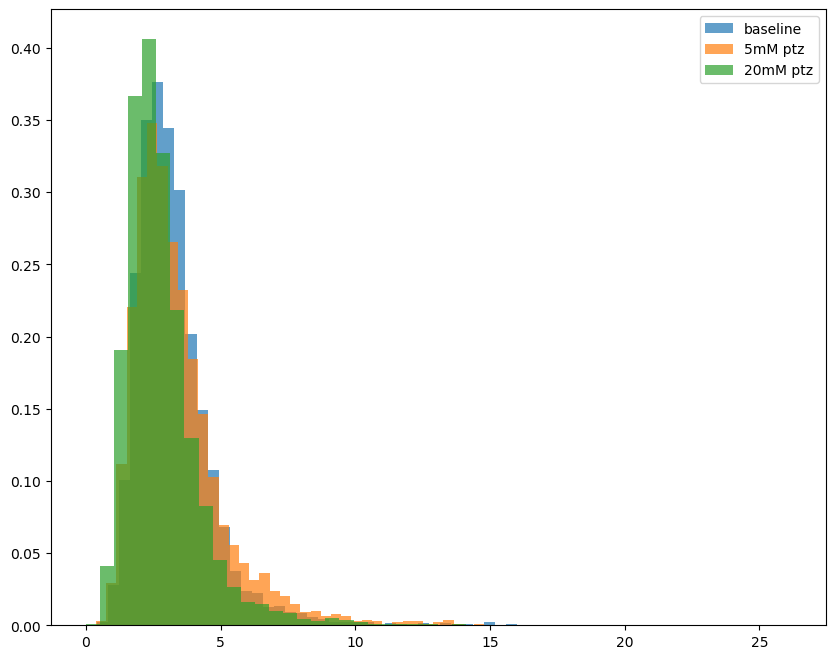

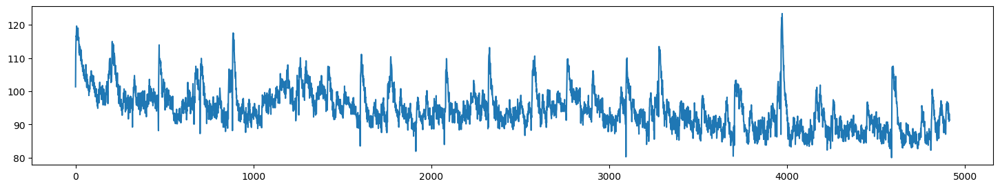

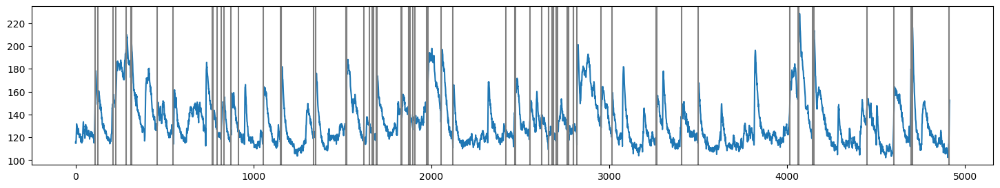

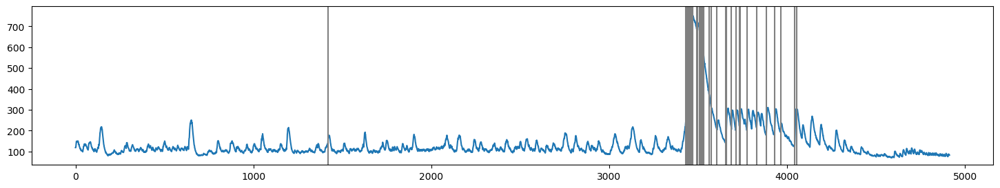

In [13]:
#NNMF - euclidean distance
#-------------------------------------
i, n_components = 9, 10
bln = np.load(blnraw[i])
p5 = np.load(p5raw[i])
p20 = np.load(p20raw[i])

#Find factors
#-------------------------------
from sklearn import decomposition
fit, dist = list(range(3)) , list(range(3)) 
bnmf = decomposition.NMF(n_components) #Define decomposition
p5nmf = decomposition.NMF(n_components) #Define decomposition
pnmf = decomposition.NMF(n_components) #Define decomposition
fit[0], fit[1], fit[2] = bnmf.fit(bln - np.min(bln)), p5nmf.fit(p5 - np.min(p5)) ,pnmf.fit(p20 - np.min(p20)) #Perform NMF on positive matrix

#Calculate euclidean distance distribution
#--------------------------------------------
dist[0], dist[1], dist[2] = np.zeros((fit[0].components_.shape[1])-1), np.zeros((fit[1].components_.shape[1])-1),np.zeros((fit[2].components_.shape[1])-1) #empty distribution
count=0
problist = list(range(3))
for e in range(len(dist)):
    for i in range(dist[e].shape[0]-1): 
        dist[e][i] = np.linalg.norm(fit[count].components_[:,i]-fit[count].components_[:,i+1]) #euclidean distance distribution
    count+=1
    
fig, ax = plt.subplots(figsize = (10,8))
ax.hist(dist[0], bins = 50 ,alpha = 0.7, density = True, label = 'baseline')
ax.hist(dist[1], bins = 50, alpha = 0.7, density = True, label = '5mM ptz')
ax.hist(dist[2], bins = 50, alpha = 0.7, density = True, label = '20mM ptz')
ax.legend()
plt.show()

#DEFINE CUTOFF 
thresh = 99
cutoff = np.percentile(dist[0], thresh)
when = list(range(2))
fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, bln)
plt.plot(mean)
plt.show()
plotlist=[p5,p20]
for i in range(2):
    when[i] = np.where(dist[i+1] > cutoff)[0]
    fig, ax = plt.subplots(figsize= (18,3))
    mean = np.apply_along_axis(np.mean, 0, plotlist[i])
    plt.plot(mean)
    for x in when[i]: plt.axvline(x=x, c='gray')
    plt.show()

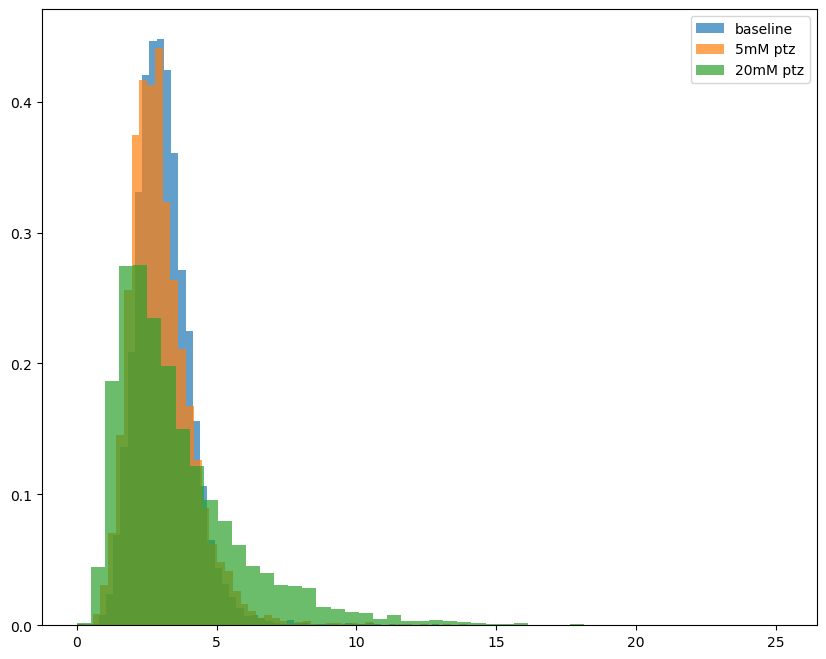

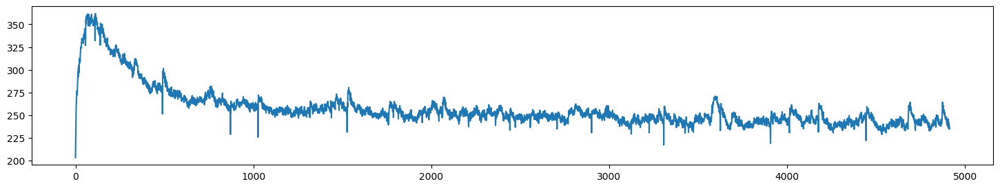

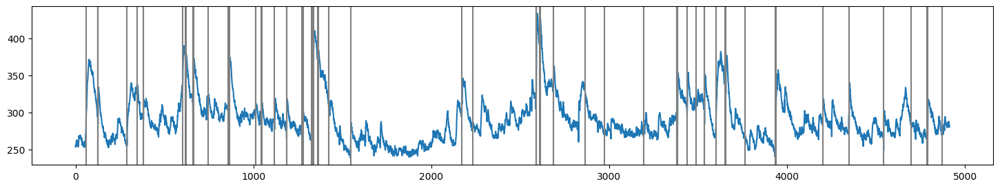

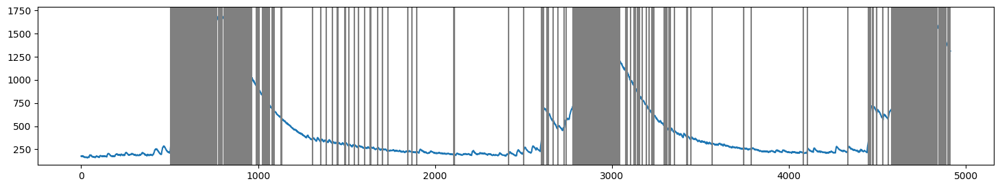

In [14]:
#NNMF - euclidean distance
#-------------------------------------
i, n_components = 10, 10
bln = np.load(blnraw[i])
p5 = np.load(p5raw[i])
p20 = np.load(p20raw[i])

#Find factors
#-------------------------------
from sklearn import decomposition
fit, dist = list(range(3)) , list(range(3)) 
bnmf = decomposition.NMF(n_components) #Define decomposition
p5nmf = decomposition.NMF(n_components) #Define decomposition
pnmf = decomposition.NMF(n_components) #Define decomposition
fit[0], fit[1], fit[2] = bnmf.fit(bln - np.min(bln)), p5nmf.fit(p5 - np.min(p5)) ,pnmf.fit(p20 - np.min(p20)) #Perform NMF on positive matrix

#Calculate euclidean distance distribution
#--------------------------------------------
dist[0], dist[1], dist[2] = np.zeros((fit[0].components_.shape[1])-1), np.zeros((fit[1].components_.shape[1])-1),np.zeros((fit[2].components_.shape[1])-1) #empty distribution
count=0
problist = list(range(3))
for e in range(len(dist)):
    for i in range(dist[e].shape[0]-1): 
        dist[e][i] = np.linalg.norm(fit[count].components_[:,i]-fit[count].components_[:,i+1]) #euclidean distance distribution
    count+=1
    
fig, ax = plt.subplots(figsize = (10,8))
ax.hist(dist[0], bins = 50 ,alpha = 0.7, density = True, label = 'baseline')
ax.hist(dist[1], bins = 50, alpha = 0.7, density = True, label = '5mM ptz')
ax.hist(dist[2], bins = 50, alpha = 0.7, density = True, label = '20mM ptz')
ax.legend()
plt.show()

#DEFINE CUTOFF 
thresh = 99
cutoff = np.percentile(dist[0], thresh)
when = list(range(2))
fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, bln)
plt.plot(mean)
plt.show()
plotlist=[p5,p20]
for i in range(2):
    when[i] = np.where(dist[i+1] > cutoff)[0]
    fig, ax = plt.subplots(figsize= (18,3))
    mean = np.apply_along_axis(np.mean, 0, plotlist[i])
    plt.plot(mean)
    for x in when[i]: plt.axvline(x=x, c='gray')
    plt.show()

# Support vector machine